# ECE 232E Project 2: Social Network Mining

# 1. Facebook network

In [ ]:
install.packages("ggplot2")
library(ggplot2)
if (!require("igraph")) install.packages("igraph")
library ("igraph")

Installing package into ‘/usr/local/lib/R/site-library’
(as ‘lib’ is unspecified)

Loading required package: igraph

Warning message in library(package, lib.loc = lib.loc, character.only = TRUE, logical.return = TRUE, :
“there is no package called ‘igraph’”
Installing package into ‘/usr/local/lib/R/site-library’
(as ‘lib’ is unspecified)


Attaching package: ‘igraph’


The following objects are masked from ‘package:stats’:

    decompose, spectrum


The following object is masked from ‘package:base’:

    union




## 1. Structural properties of the Facebook network

<div class="alert alert-block alert-success">
<b>Question 1:</b> A first look at the network:

<ul>  
  <li><b>Question 1.1:</b> Report the number of nodes and number of edges of the Facebook network.</li>
  <li><b>Question 1.2:</b> Is the Facebook network connected? If not, find the giant connected component (GCC) of the network and report the size of the GCC.</li>
</ul>
</div>

[1] "Number of nodes: 4039"
[1] "Number of edges: 88234"
[1] "Is the Facebook network connected?: TRUE"


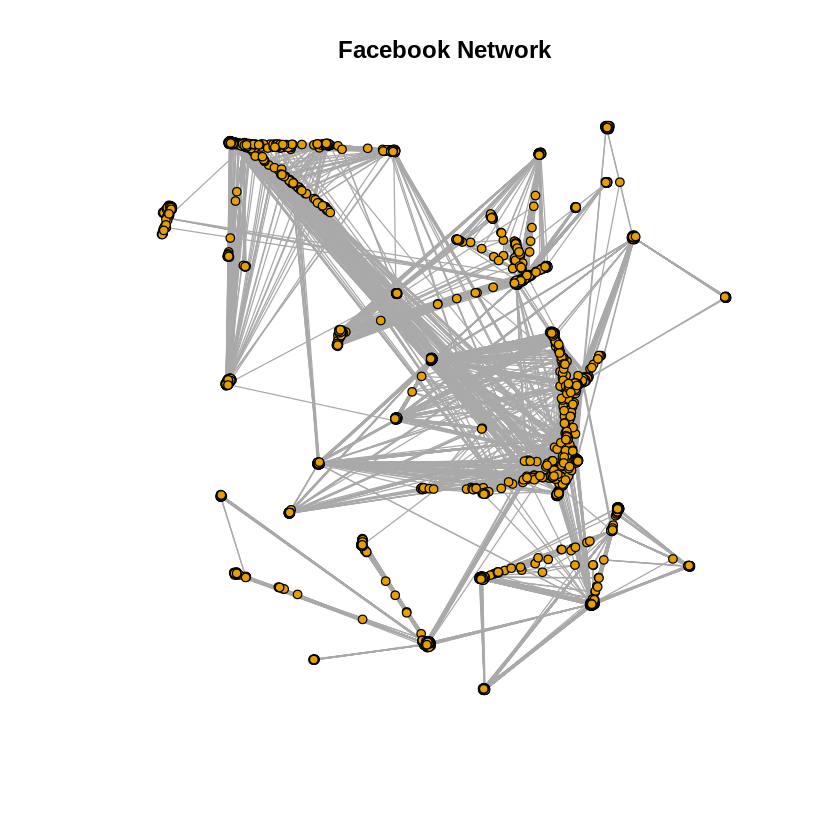

In [ ]:
fb_combined <- read.table("facebook_combined.txt")
tmp_mat <- as.matrix(fb_combined)+1
g <- graph.edgelist(tmp_mat,directed=FALSE) #read the graph 

print(sprintf("Number of nodes: %d", vcount(g)))
print(sprintf("Number of edges: %d", ecount(g)))

print(sprintf("Is the Facebook network connected?: %s", is.connected(g)))

plot(g, vertex.label=NA, vertex.size=3, main="Facebook Network")

<div class="alert alert-block alert-success">
<b>Answer 1:</b> A first look at the network:

<ul>  
  <li><b>Answer 1.1:</b> The number of the nodes is 4039 and the edges is 88234.</li>
  <li><b>Answer 1.2:</b> Yes, the Facebook network is connected.</li>
</ul>
</div>

<div class="alert alert-block alert-success">
<b>Question 2:</b> Find the diameter of the network. If the network is not connected, then find the diameter of the GCC.
</div>

In [ ]:
print(sprintf("The diameter of the network: %d", diameter(g)))

[1] "The diameter of the network: 8"


<div class="alert alert-block alert-success">
<b>Answer 2:</b> Since the network is connected, we find the diameter of the entire network, which is 8.
</div>

<div class="alert alert-block alert-success">
<b>Question 3:</b> Plot the degree distribution of the facebook network and report the average degree.
</div>

[1] "The average degreee of the facebook network: 43.691013"


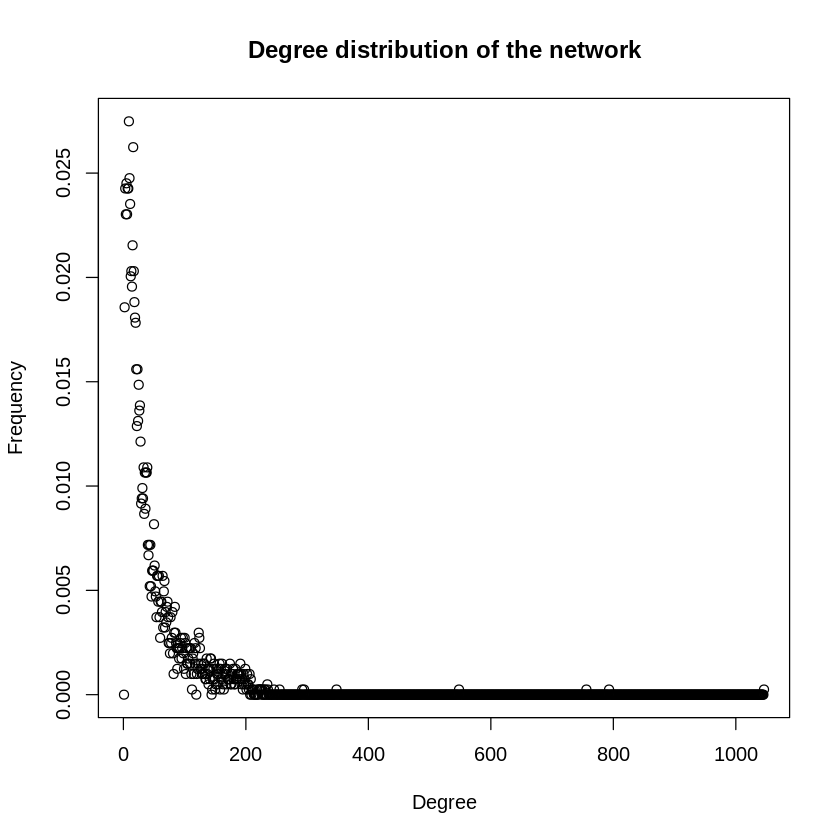

In [ ]:
deg_g <- degree(g)
print(sprintf("The average degreee of the facebook network: %f", mean(deg_g)))
plot(degree.distribution(g), xlab="Degree", ylab="Frequency", 
     main="Degree distribution of the network")

<div class="alert alert-block alert-success">
<b>Answer 3:</b> The plot of degree distribution is shown above and the average degreee of the facebook network is 43.691013.
</div>

<div class="alert alert-block alert-success">
<b>Question 4:</b> Plot the degree distribution of Question 3 in a log-log scale. Try to fit a line to the plot and estimate the slope of the line.
</div>


Call:
lm(formula = dist_log ~ deg_log)

Coefficients:
(Intercept)      deg_log  
    -0.6611      -1.2475  



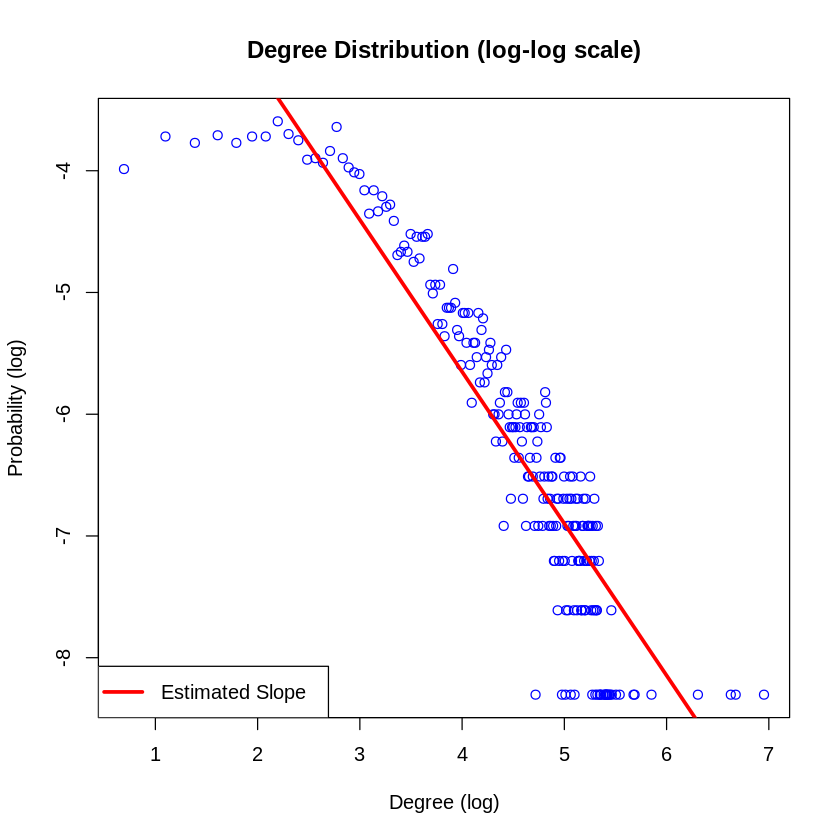

In [ ]:
# smaller network
deg_dist_g <- degree.distribution(g)
idx <- which(deg_dist_g !=0, arr.ind=T)
deg_log <- log(seq(1:length(deg_dist_g)))[idx]
dist_log <- log(deg_dist_g)[idx]
plot(deg_log, dist_log, main="Degree Distribution (log-log scale)",
     xlab="Degree (log)", ylab="Probability (log)", col="blue")

# linear regression
lr <- lm(dist_log ~ deg_log)
print(lr)
abline(lr, col="red", lwd=3)
legend('bottomleft', lty = c(1), lwd = c(3), pch=c(NA),
       legend=c("Estimated Slope"),
       col=c('red'))

<div class="alert alert-block alert-success">
<b>Answer 4:</b> The result is shown above.
</div>

## 2. Personalized network

<div class="alert alert-block alert-success">
<b>Question 5:</b> Create a personalized network of the user whose ID is 1. How many nodes and edges does this personalized network have?
</div>

[1] "Number of nodes: 348"
[1] "Number of edges: 2866"


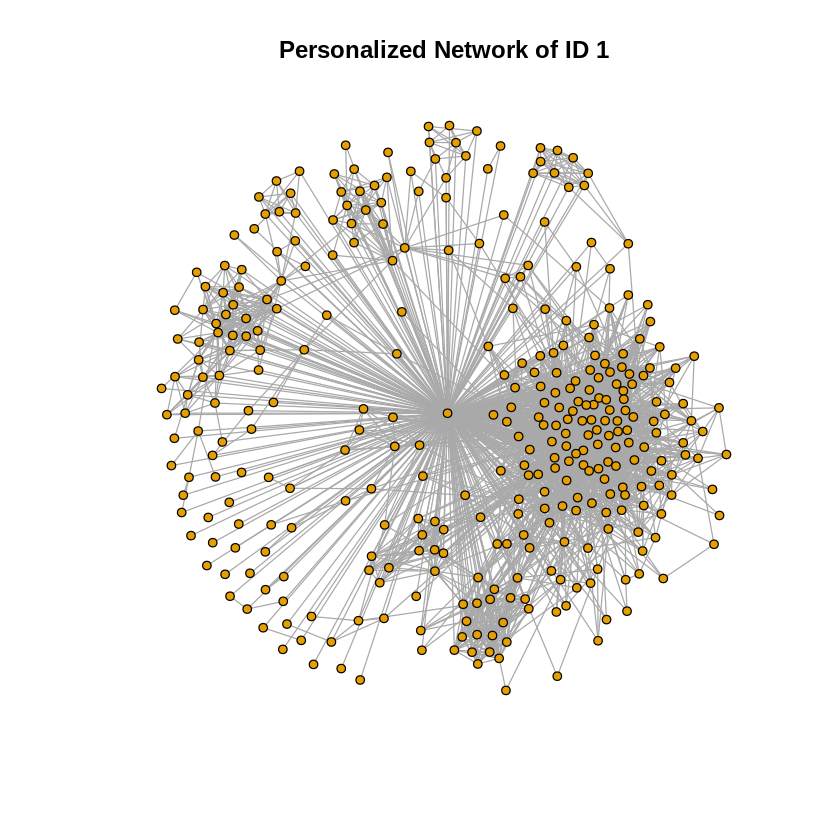

In [ ]:
id <- 1
g_id1 <- make_ego_graph(g, order=1, nodes=c(id))[[1]]

plot(g_id1, vertex.label=NA, vertex.size=3, 
     main=sprintf("Personalized Network of ID %d", id))

print(sprintf("Number of nodes: %d", vcount(g_id1)))
print(sprintf("Number of edges: %d", ecount(g_id1)))

<div class="alert alert-block alert-success">
<b>Answer 5:</b> This personalized network has 348 nodes and 2866 edges
</div>

<div class="alert alert-block alert-success">
<b>Question 6:</b> What is the diameter of the personalized network? Please state a trivial upper and lower bound for the diameter of the personalized network.
</div>

In [ ]:
print(diameter(g_id1))

[1] 2


<div class="alert alert-block alert-success">
<b>Answer 6:</b> The diameter of the personalized network of ID 1 is 2. The trivial upper and lower bound for the diameter of the personalized network is 2 and 1, respectively.
</div>

<div class="alert alert-block alert-success">
<b>Question 7:</b> In the context of the personalized network, what is the meaning of the diameter of the personalized network to be equal to the upper bound you derived in Question 6. What is the meaning of the diameter of the personalized network to be equal to the lower bound you derived in Question 6 (assuming there are more than 3 nodes in the personalized network)?
</div>

<div class="alert alert-block alert-success">
<b>Answer 7:</b> 

If the diameter of the personalized network is equal to the upper bound "2" derived in Question 6, it means that there are at least 2 nodes ($v_{i}$, $v_{j}$) in this personalized network that are not connected directly. In fact, they are connected through the center node $v_{c}$, whose distance is equal to 1 to all nodes. Thus the diameter is equal to 2. In real world, it means that person $v_{i}$ and person $v_{j}$ are not friend directly, but they both are friends of person $v_{c}$. On the other hand, if the diameter of the personalized network is equal to the lower bound "1" derived in Question 6, it means that any 2 nodes in this personalized network are connected directly together (no need to go through the center node $v_{c}$) and thus the diameter is 1. In real world, it means that all people in this group are all mutual friends to each other.
</div>

## 3. Core node’s personalized network

<div class="alert alert-block alert-success">
<b>Question 8:</b> How many core nodes are there in the Facebook network. What is the average degree of the core nodes?
</div>

In [ ]:
deg_g <- degree(g)
nodes_list <- deg_g > 200
core_nodes <- which(nodes_list==TRUE)
no_of_core_nodes <- length(core_nodes)
avg_core_node_degree <- mean(deg_g[core_nodes])

print(sprintf("Number of the core nodes in the Facebook network: %d", no_of_core_nodes))
print(sprintf("The average degree of the core nodes: %f", avg_core_node_degree))

[1] "Number of the core nodes in the Facebook network: 40"
[1] "The average degree of the core nodes: 279.375000"


<div class="alert alert-block alert-success">
<b>Answer 8:</b> There are 40 core nodes in the Facebook network and the average degree is around 279.
</div>

### 3.1. Community structure of core node’s personalized network

<div class="alert alert-block alert-success">
<b>Question 9:</b> For each of the above core node’s personalized network, find the community structure using Fast-Greedy, Edge-Betweenness, and Infomap community detection algorithms. Compare the modularity scores of the algorithms. For visualization purpose, display the community structure of the core node’s personalized networks using colors. Nodes belonging to the same community should have the same color and nodes belonging to different communities should have different color. In this question, you should have 15 plots in total.
</div>


[1] "Modularity with Fast-Greedy, Node ID: 1: 0.413101"
[1] "Modularity with Edge-Betweenness, Node ID: 1: 0.353302"
[1] "Modularity with Infomap, Node ID: 1: 0.389118"


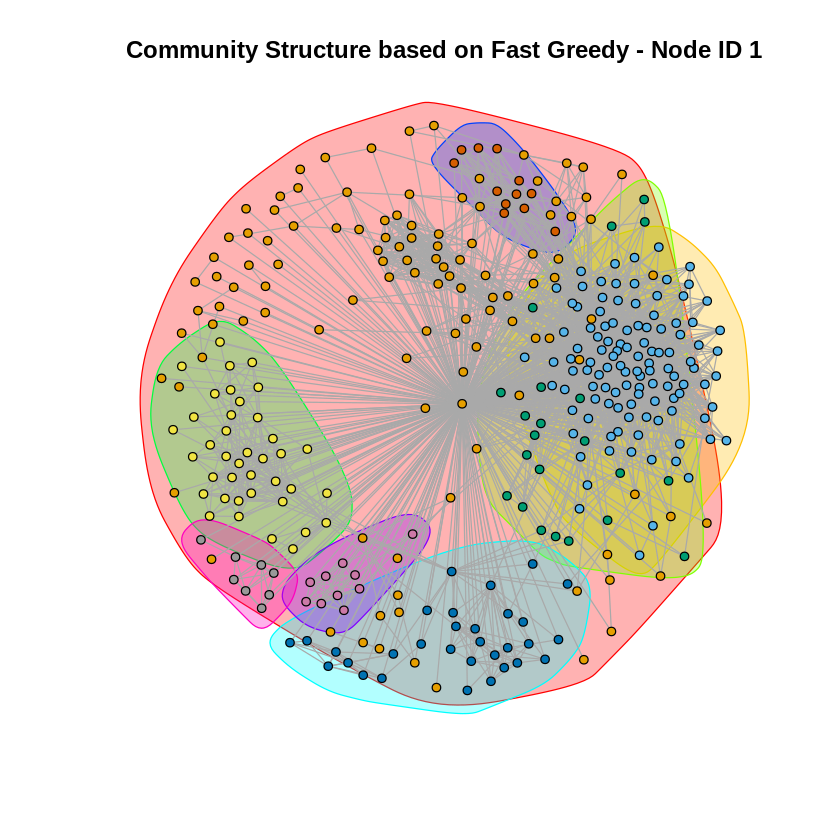

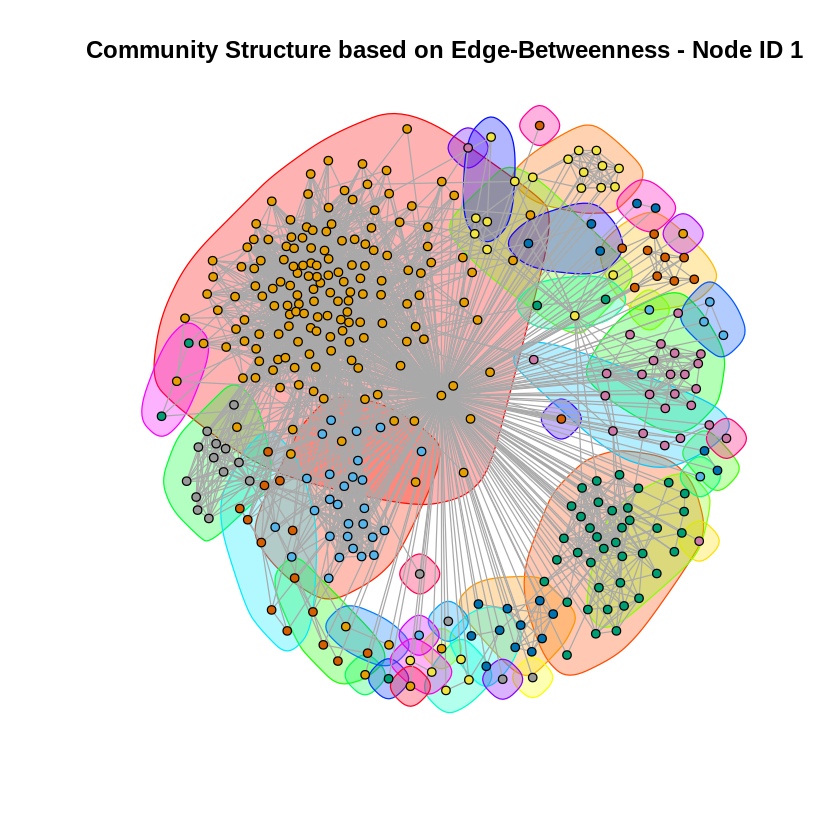

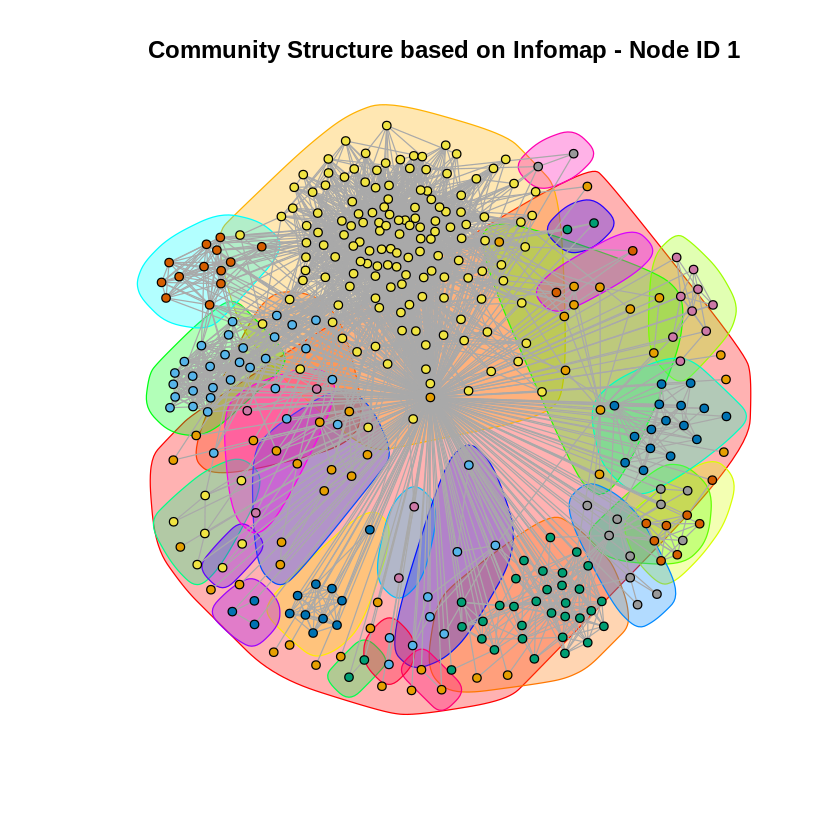

In [ ]:
# Node ID 1

# get the personalized network
id <- 1
g_id <- make_ego_graph(g, order=1, nodes=c(id))[[1]]

# find community structure
fgc <- cluster_fast_greedy(g_id)
ebc <- cluster_edge_betweenness(g_id)
imc <- cluster_infomap(g_id)

# modularity calculation
print(sprintf("Modularity with Fast-Greedy, Node ID: %d: %f", id, modularity(fgc)))
print(sprintf("Modularity with Edge-Betweenness, Node ID: %d: %f", id, modularity(ebc)))
print(sprintf("Modularity with Infomap, Node ID: %d: %f", id, modularity(imc)))

# plot community structure
plot(g_id, mark.groups=fgc, vertex.size=3, vertex.color=fgc$membership, vertex.label=NA, 
     main=sprintf("Community Structure based on Fast Greedy - Node ID %d", id))
plot(g_id, mark.groups=ebc, vertex.size=3, vertex.color=ebc$membership, vertex.label=NA, 
     main=sprintf("Community Structure based on Edge-Betweenness - Node ID %d", id))
plot(g_id, mark.groups=imc, vertex.size=3, vertex.color=imc$membership, vertex.label=NA, 
     main=sprintf("Community Structure based on Infomap - Node ID %d", id))

[1] "Modularity with Fast-Greedy, Node ID: 108: 0.435929"
[1] "Modularity with Edge-Betweenness, Node ID: 108: 0.506755"
[1] "Modularity with Infomap, Node ID: 108: 0.508249"


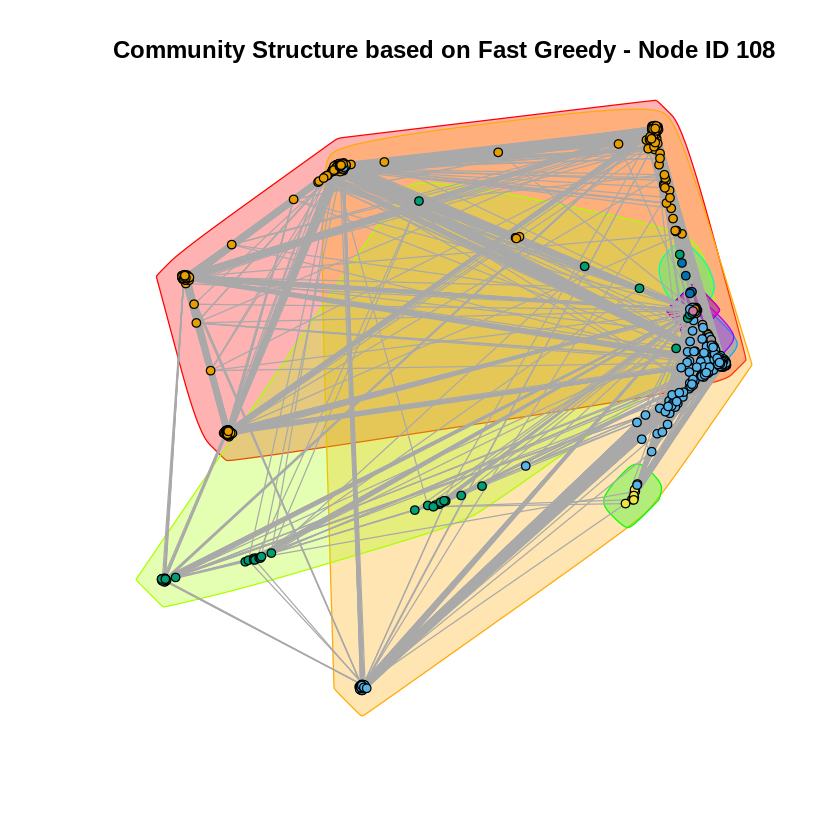

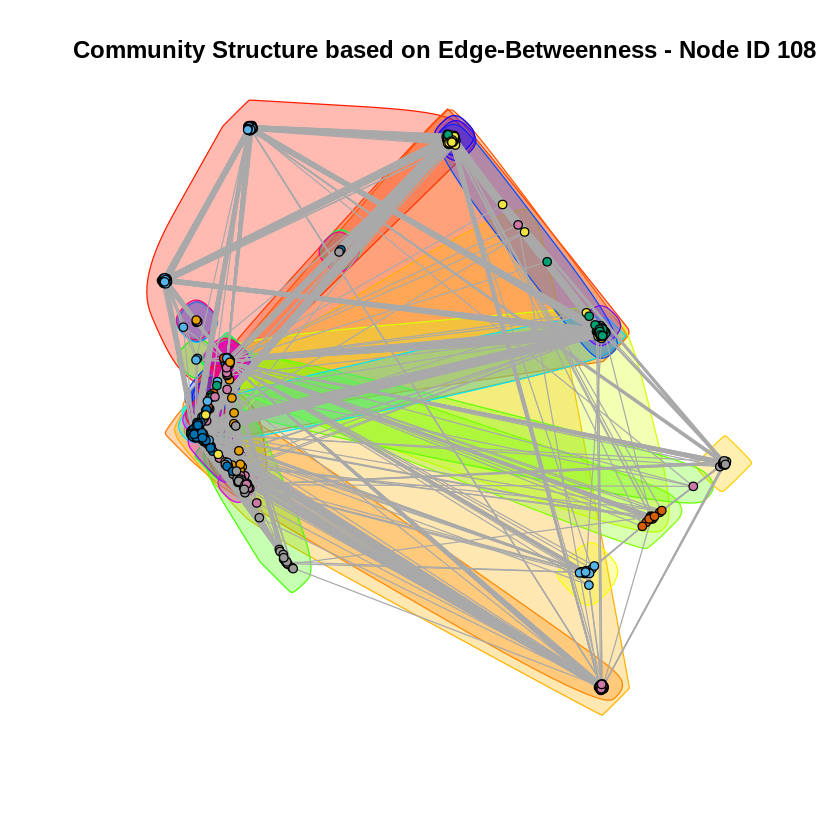

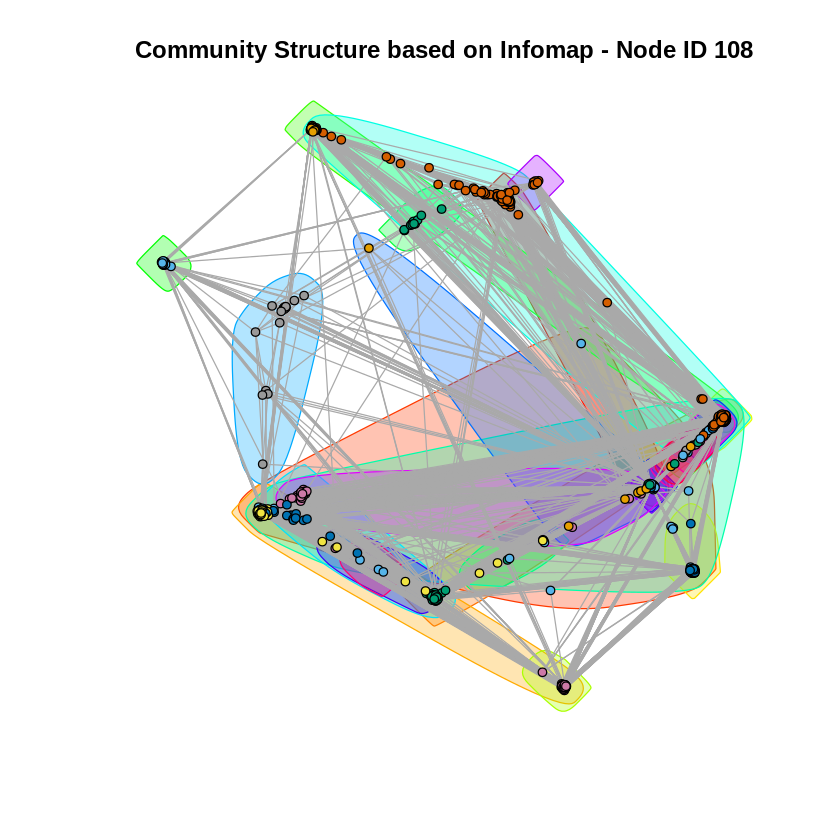

In [ ]:
# Node ID 108

# get the personalized network
id <- 108
g_id <- make_ego_graph(g, order=1, nodes=c(id))[[1]]

# find community structure
fgc <- cluster_fast_greedy(g_id)
ebc <- cluster_edge_betweenness(g_id)
imc <- cluster_infomap(g_id)

# modularity calculation
print(sprintf("Modularity with Fast-Greedy, Node ID: %d: %f", id, modularity(fgc)))
print(sprintf("Modularity with Edge-Betweenness, Node ID: %d: %f", id, modularity(ebc)))
print(sprintf("Modularity with Infomap, Node ID: %d: %f", id, modularity(imc)))

# plot community structure
plot(g_id, mark.groups=fgc, vertex.size=3, vertex.color=fgc$membership, vertex.label=NA, 
     main=sprintf("Community Structure based on Fast Greedy - Node ID %d", id))
plot(g_id, mark.groups=ebc, vertex.size=3, vertex.color=ebc$membership, vertex.label=NA, 
     main=sprintf("Community Structure based on Edge-Betweenness - Node ID %d", id))
plot(g_id, mark.groups=imc, vertex.size=3, vertex.color=imc$membership, vertex.label=NA, 
     main=sprintf("Community Structure based on Infomap - Node ID %d", id))

[1] "Modularity with Fast-Greedy, Node ID: 349: 0.251715"
[1] "Modularity with Edge-Betweenness, Node ID: 349: 0.133528"
[1] "Modularity with Infomap, Node ID: 349: 0.096029"


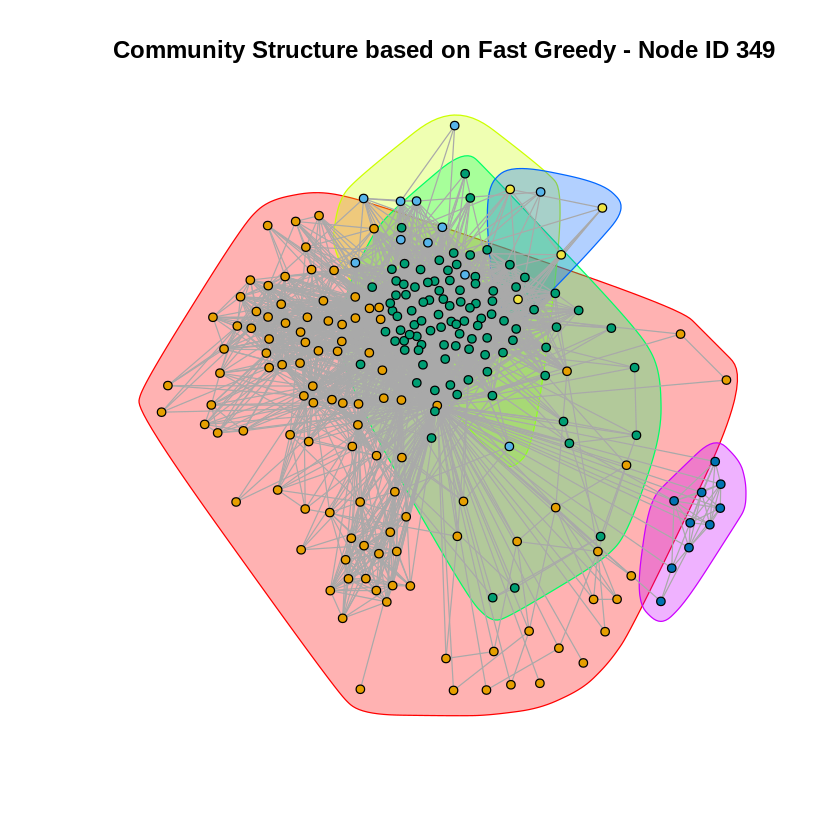

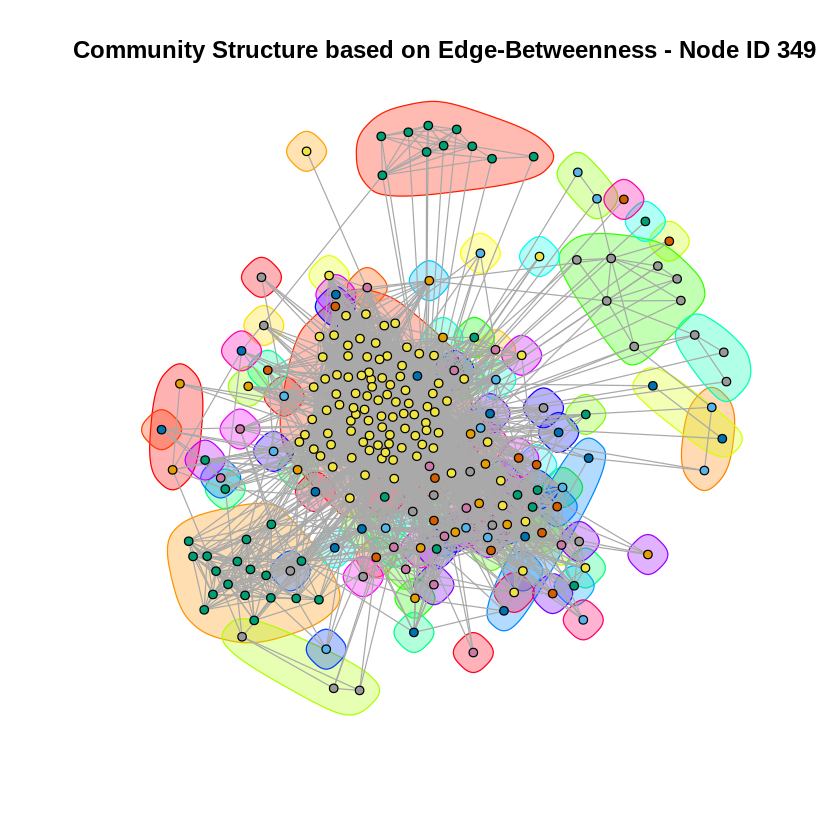

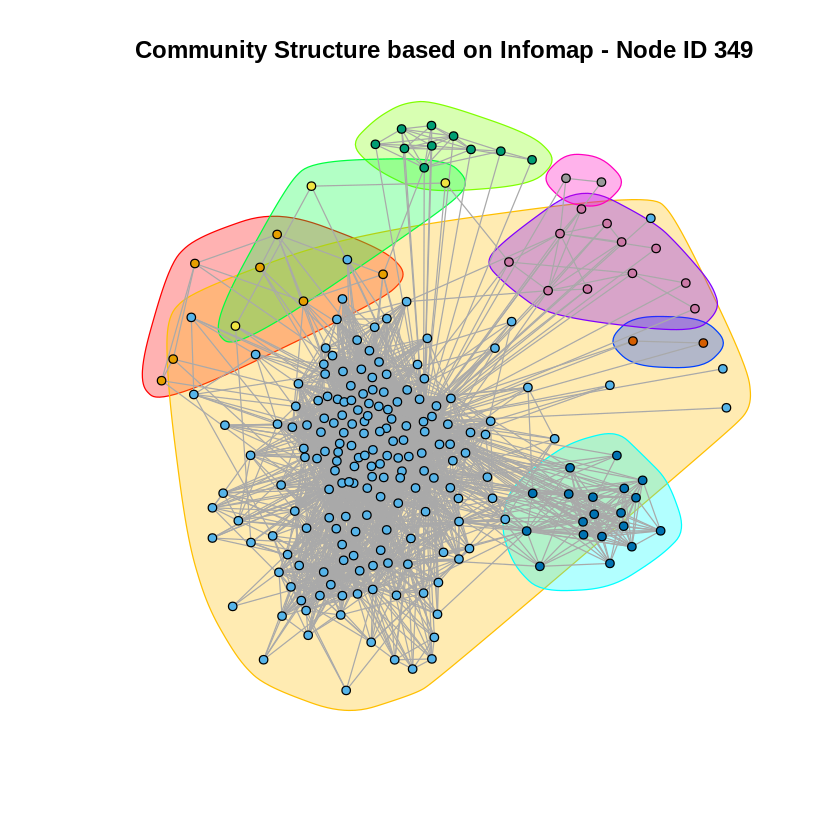

In [ ]:
# Node ID 349

# get the personalized network
id <- 349
g_id <- make_ego_graph(g, order=1, nodes=c(id))[[1]]

# find community structure
fgc <- cluster_fast_greedy(g_id)
ebc <- cluster_edge_betweenness(g_id)
imc <- cluster_infomap(g_id)

# modularity calculation
print(sprintf("Modularity with Fast-Greedy, Node ID: %d: %f", id, modularity(fgc)))
print(sprintf("Modularity with Edge-Betweenness, Node ID: %d: %f", id, modularity(ebc)))
print(sprintf("Modularity with Infomap, Node ID: %d: %f", id, modularity(imc)))

# plot community structure
plot(g_id, mark.groups=fgc, vertex.size=3, vertex.color=fgc$membership, vertex.label=NA, 
     main=sprintf("Community Structure based on Fast Greedy - Node ID %d", id))
plot(g_id, mark.groups=ebc, vertex.size=3, vertex.color=ebc$membership, vertex.label=NA, 
     main=sprintf("Community Structure based on Edge-Betweenness - Node ID %d", id))
plot(g_id, mark.groups=imc, vertex.size=3, vertex.color=imc$membership, vertex.label=NA, 
     main=sprintf("Community Structure based on Infomap - Node ID %d", id))

[1] "Modularity with Fast-Greedy, Node ID: 484: 0.507002"
[1] "Modularity with Edge-Betweenness, Node ID: 484: 0.489095"
[1] "Modularity with Infomap, Node ID: 484: 0.515279"


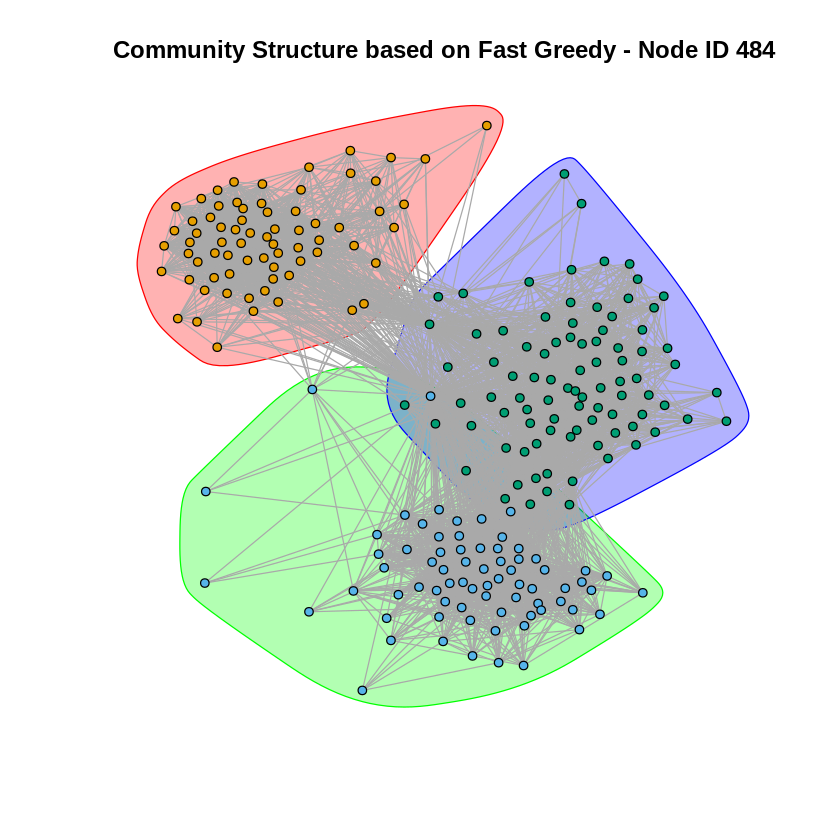

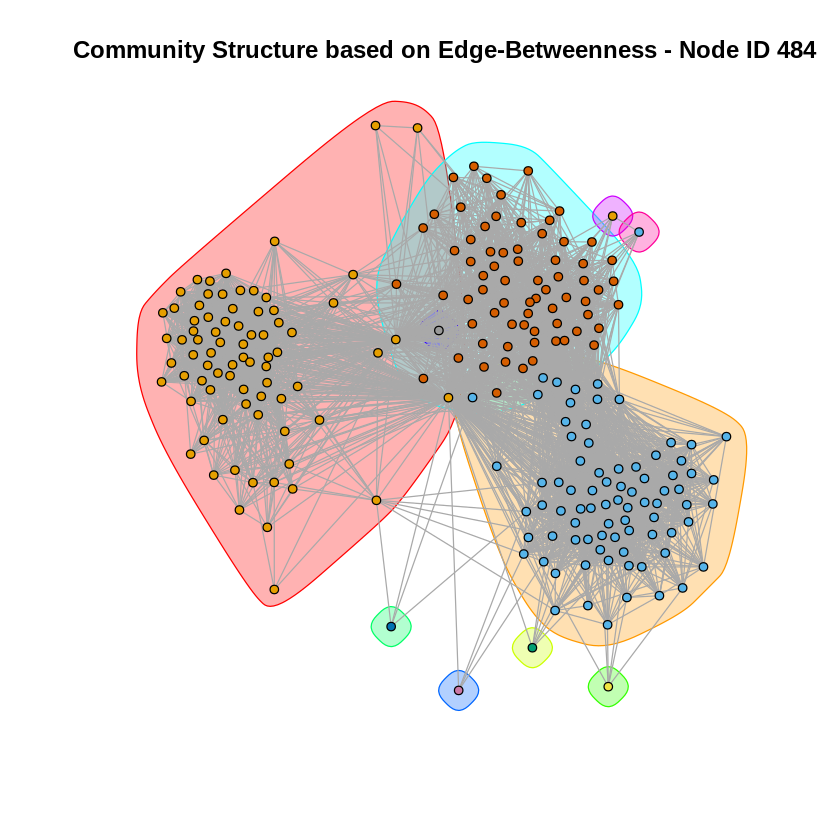

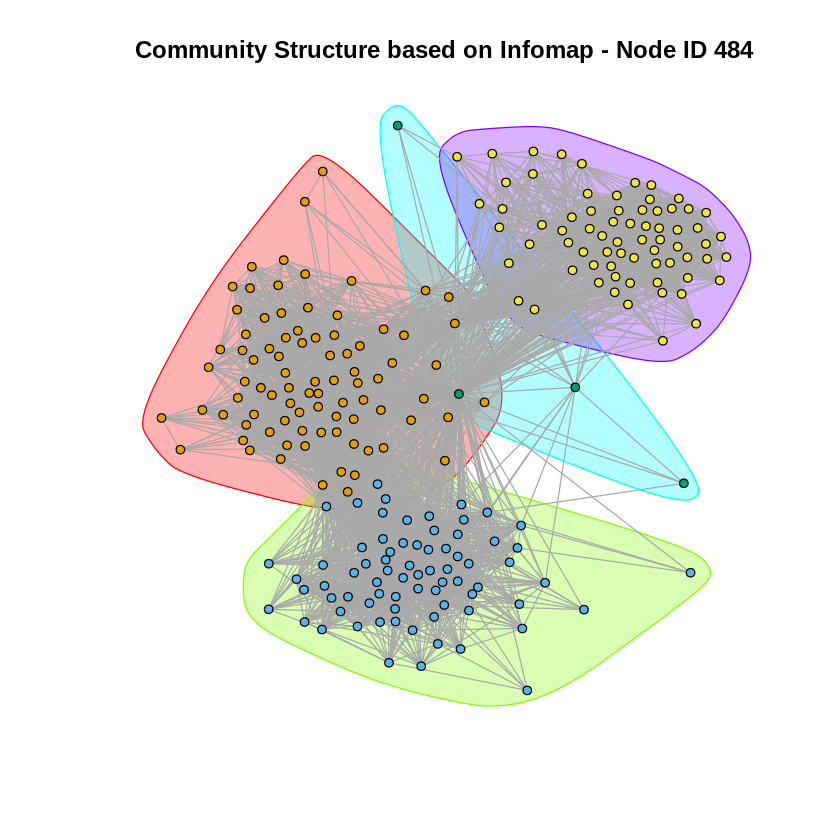

In [ ]:
# Node ID 484

# get the personalized network
id <- 484
g_id <- make_ego_graph(g, order=1, nodes=c(id))[[1]]

# find community structure
fgc <- cluster_fast_greedy(g_id)
ebc <- cluster_edge_betweenness(g_id)
imc <- cluster_infomap(g_id)

# modularity calculation
print(sprintf("Modularity with Fast-Greedy, Node ID: %d: %f", id, modularity(fgc)))
print(sprintf("Modularity with Edge-Betweenness, Node ID: %d: %f", id, modularity(ebc)))
print(sprintf("Modularity with Infomap, Node ID: %d: %f", id, modularity(imc)))

# plot community structure
plot(g_id, mark.groups=fgc, vertex.size=3, vertex.color=fgc$membership, vertex.label=NA, 
     main=sprintf("Community Structure based on Fast Greedy - Node ID %d", id))
plot(g_id, mark.groups=ebc, vertex.size=3, vertex.color=ebc$membership, vertex.label=NA, 
     main=sprintf("Community Structure based on Edge-Betweenness - Node ID %d", id))
plot(g_id, mark.groups=imc, vertex.size=3, vertex.color=imc$membership, vertex.label=NA, 
     main=sprintf("Community Structure based on Infomap - Node ID %d", id))

[1] "Modularity with Fast-Greedy, Node ID: 1087: 0.145531"
[1] "Modularity with Edge-Betweenness, Node ID: 1087: 0.027624"
[1] "Modularity with Infomap, Node ID: 1087: 0.026907"


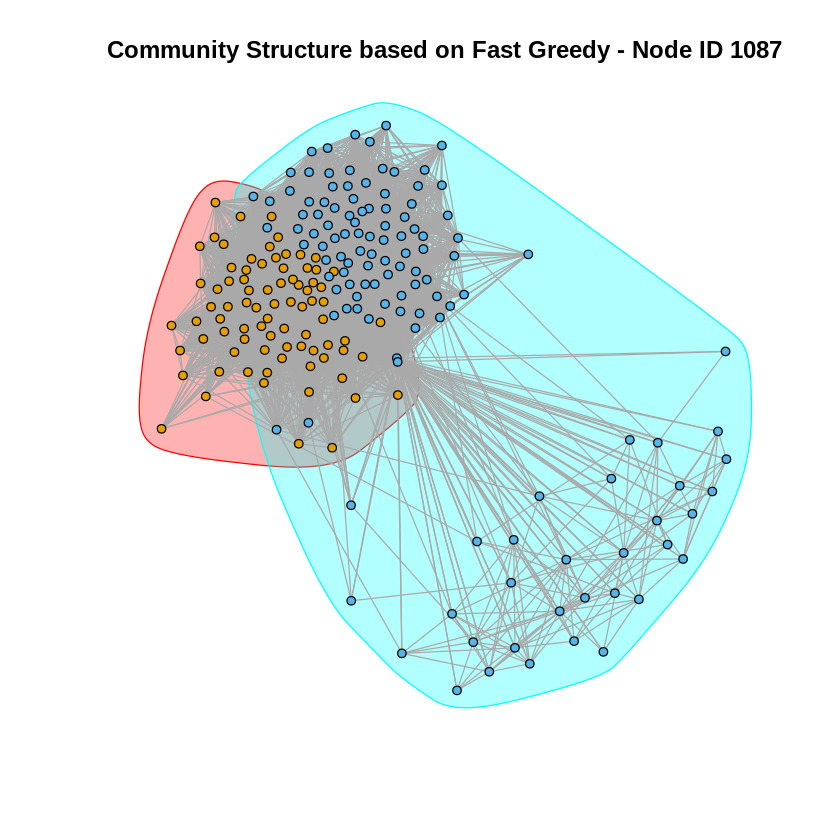

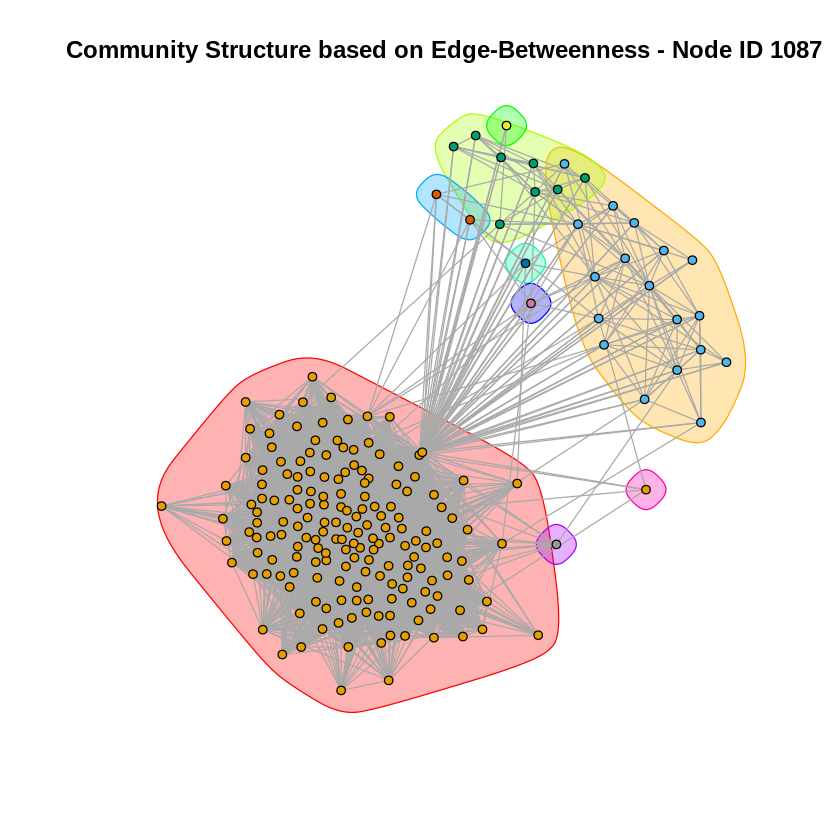

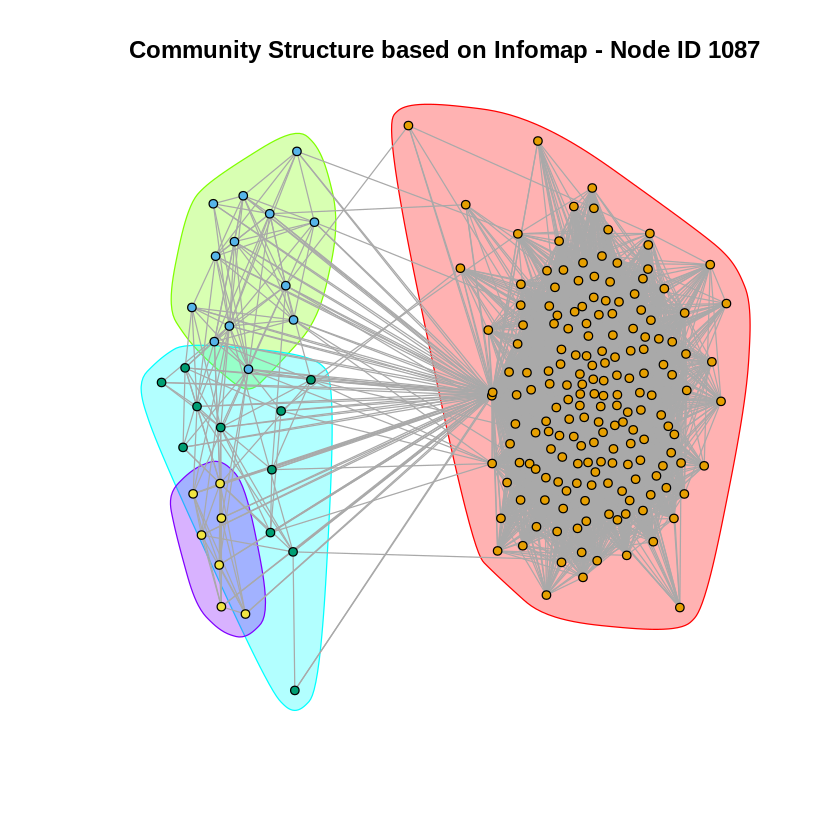

In [ ]:
# Node ID 1087

# get the personalized network
id <- 1087
g_id <- make_ego_graph(g, order=1, nodes=c(id))[[1]]

# find community structure
fgc <- cluster_fast_greedy(g_id)
ebc <- cluster_edge_betweenness(g_id)
imc <- cluster_infomap(g_id)

# modularity calculation
print(sprintf("Modularity with Fast-Greedy, Node ID: %d: %f", id, modularity(fgc)))
print(sprintf("Modularity with Edge-Betweenness, Node ID: %d: %f", id, modularity(ebc)))
print(sprintf("Modularity with Infomap, Node ID: %d: %f", id, modularity(imc)))

# plot community structure
plot(g_id, mark.groups=fgc, vertex.size=3, vertex.color=fgc$membership, vertex.label=NA, 
     main=sprintf("Community Structure based on Fast Greedy - Node ID %d", id))
plot(g_id, mark.groups=ebc, vertex.size=3, vertex.color=ebc$membership, vertex.label=NA, 
     main=sprintf("Community Structure based on Edge-Betweenness - Node ID %d", id))
plot(g_id, mark.groups=imc, vertex.size=3, vertex.color=imc$membership, vertex.label=NA, 
     main=sprintf("Community Structure based on Infomap - Node ID %d", id))

<div class="alert alert-block alert-success">
<b>Answer 9:</b> The results of the community structures and the mudularity scores of each Node ID are reported above. Based on the results, the personal network with node ID 484 yields in average of all community detection algorithms the best modularity score, which is around 0.50. This can also be observed from the community structure plots of node 484 as its density of each group are roughly homogenous and form distinguishable regions of high connectedness with sparse connectivity among the high-density regions. The personal network with node ID 1087, on the other hand, has the lowest modularity score in each algorithm, which can also be observed in the plots as the network has relative dense connections between nodes in different modules. Considering the modularity score of each community detection algorithm, the personalized network of node ID 484 achieve the highest modularity score in Fast-Greedy and Infomap algorithms and node ID 108 in Edge-Betweenness algorithm.
</div>

### 3.2. Community structure with the core node removed

<div class="alert alert-block alert-success">
<b>Question 10:</b> For each of the core node’s personalized network (use same core nodes as Question 9), remove the core node from the personalized network and find the community structure of the modified personalized network. Use the same community detection algorithm as Question 9. Compare the modularity score of the community structure of the modified personalized network with the modularity score of the community structure of the personalized network of Question 9. For visualization purpose, display the community structure of the modified personalized network using colors. In this question, you should have 15 plots in total.
</div>


[1] "Modularity with Fast-Greedy, without Node ID: 1: 0.441853"
[1] "Modularity with Edge-Betweenness, without Node ID: 1: 0.416146"
[1] "Modularity with Infomap, without Node ID: 1: 0.418008"


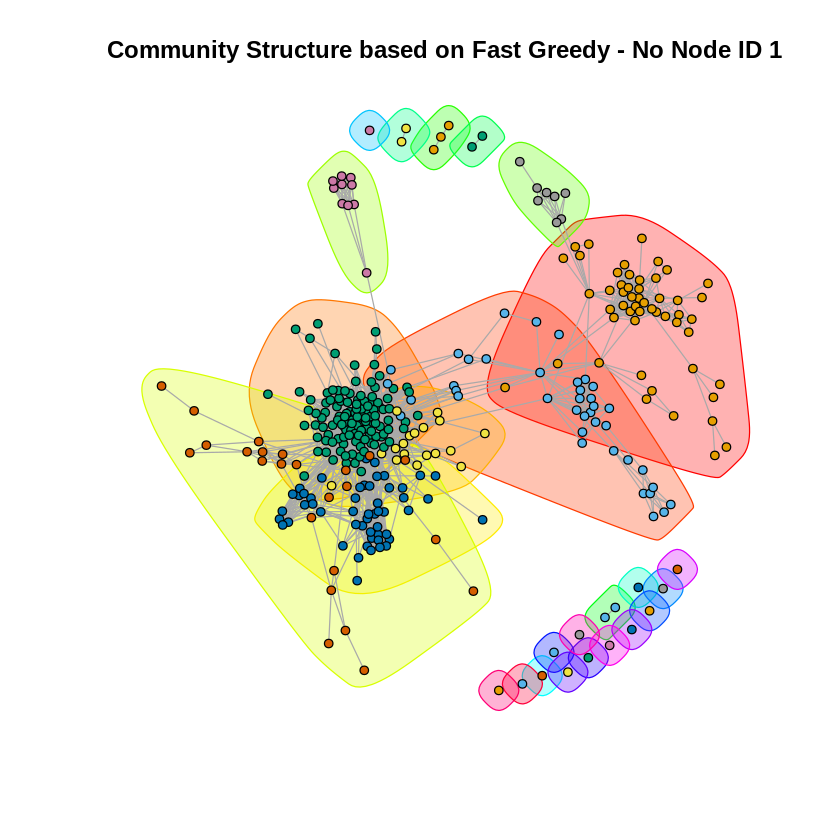

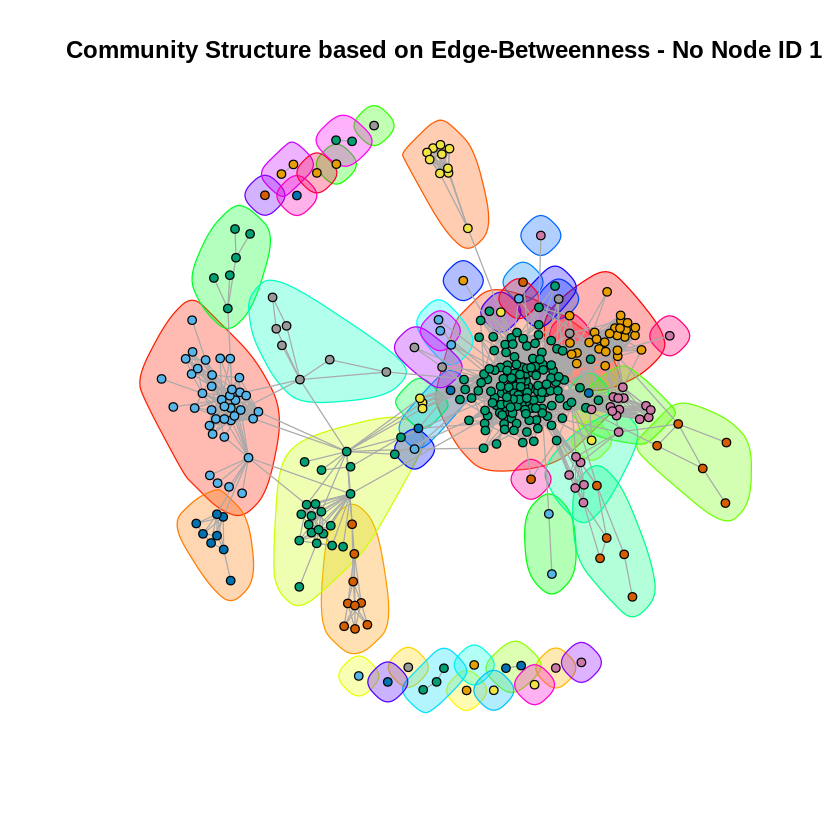

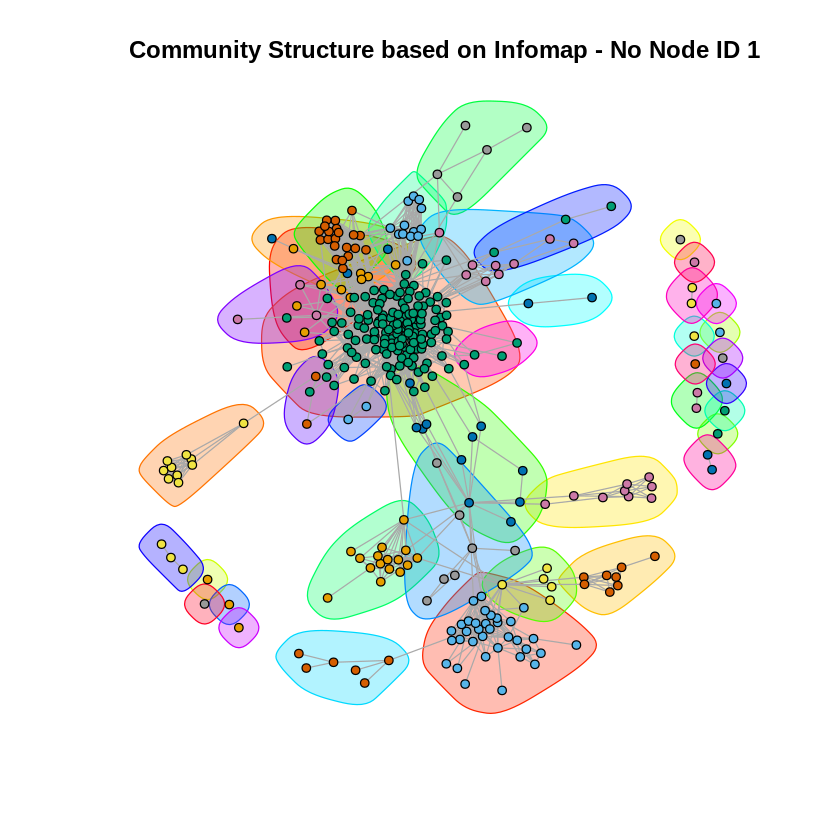

In [ ]:
# Node ID 1

# get the personalized network
id <- 1
g_noid <- induced_subgraph(g, neighbors(g, id))

# find community structure
fgc <- cluster_fast_greedy(g_noid)
ebc <- cluster_edge_betweenness(g_noid)
imc <- cluster_infomap(g_noid)

# modularity calculation
print(sprintf("Modularity with Fast-Greedy, without Node ID: %d: %f", id, modularity(fgc)))
print(sprintf("Modularity with Edge-Betweenness, without Node ID: %d: %f", id, modularity(ebc)))
print(sprintf("Modularity with Infomap, without Node ID: %d: %f", id, modularity(imc)))

# plot community structure
plot(g_noid, mark.groups=fgc, vertex.size=3, vertex.color=fgc$membership, vertex.label=NA, 
     main=sprintf("Community Structure based on Fast Greedy - No Node ID %d", id))
plot(g_noid, mark.groups=ebc, vertex.size=3, vertex.color=ebc$membership, vertex.label=NA, 
     main=sprintf("Community Structure based on Edge-Betweenness - No Node ID %d", id))
plot(g_noid, mark.groups=imc, vertex.size=3, vertex.color=imc$membership, vertex.label=NA, 
     main=sprintf("Community Structure based on Infomap - No Node ID %d", id))

[1] "Modularity with Fast-Greedy, without Node ID: 108: 0.458127"
[1] "Modularity with Edge-Betweenness, without Node ID: 108: 0.521322"
[1] "Modularity with Infomap, without Node ID: 108: 0.520652"


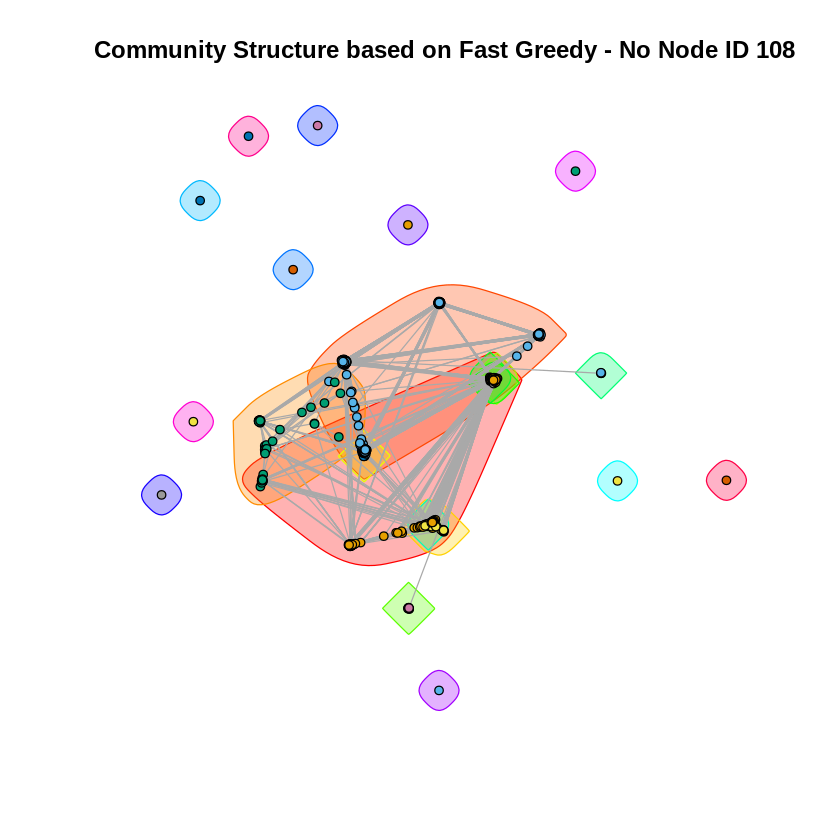

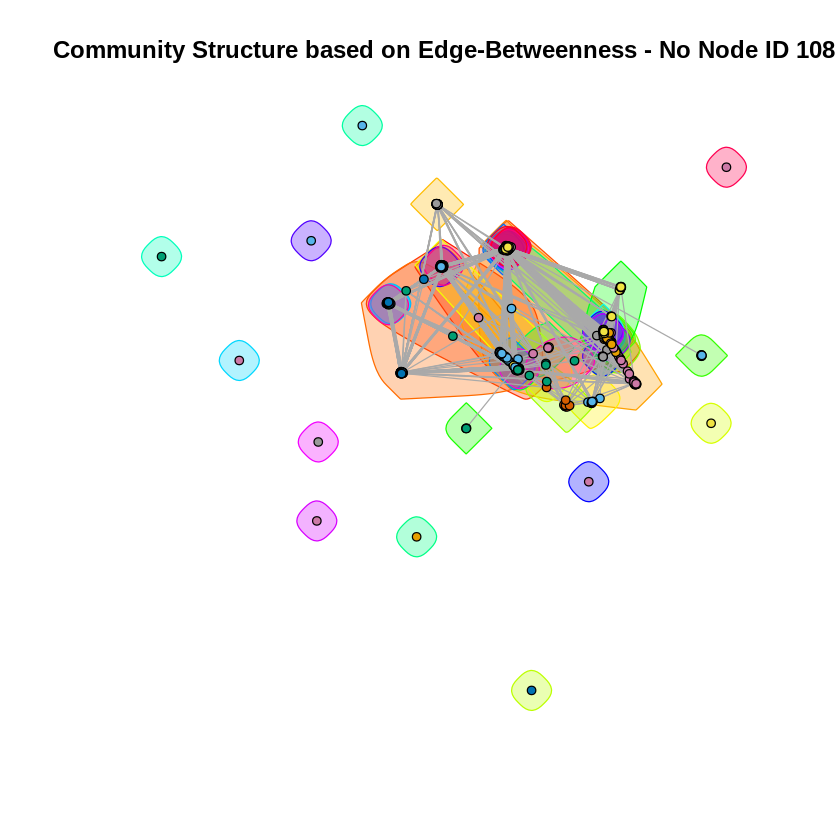

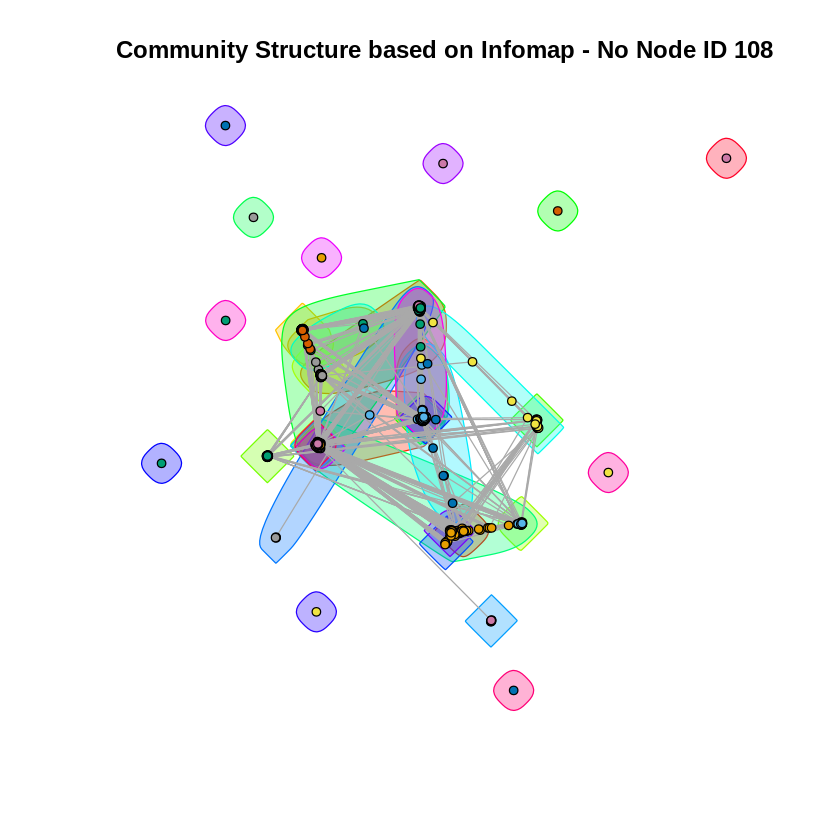

In [ ]:
# Node ID 108

# get the personalized network
id <- 108
g_noid <- induced_subgraph(g, neighbors(g, id))

# find community structure
fgc <- cluster_fast_greedy(g_noid)
ebc <- cluster_edge_betweenness(g_noid)
imc <- cluster_infomap(g_noid)

# modularity calculation
print(sprintf("Modularity with Fast-Greedy, without Node ID: %d: %f", id, modularity(fgc)))
print(sprintf("Modularity with Edge-Betweenness, without Node ID: %d: %f", id, modularity(ebc)))
print(sprintf("Modularity with Infomap, without Node ID: %d: %f", id, modularity(imc)))

# plot community structure
plot(g_noid, mark.groups=fgc, vertex.size=3, vertex.color=fgc$membership, vertex.label=NA, 
     main=sprintf("Community Structure based on Fast Greedy - No Node ID %d", id))
plot(g_noid, mark.groups=ebc, vertex.size=3, vertex.color=ebc$membership, vertex.label=NA, 
     main=sprintf("Community Structure based on Edge-Betweenness - No Node ID %d", id))
plot(g_noid, mark.groups=imc, vertex.size=3, vertex.color=imc$membership, vertex.label=NA, 
     main=sprintf("Community Structure based on Infomap - No Node ID %d", id))

[1] "Modularity with Fast-Greedy, without Node ID: 349: 0.245692"
[1] "Modularity with Edge-Betweenness, without Node ID: 349: 0.150566"
[1] "Modularity with Infomap, without Node ID: 349: 0.246578"


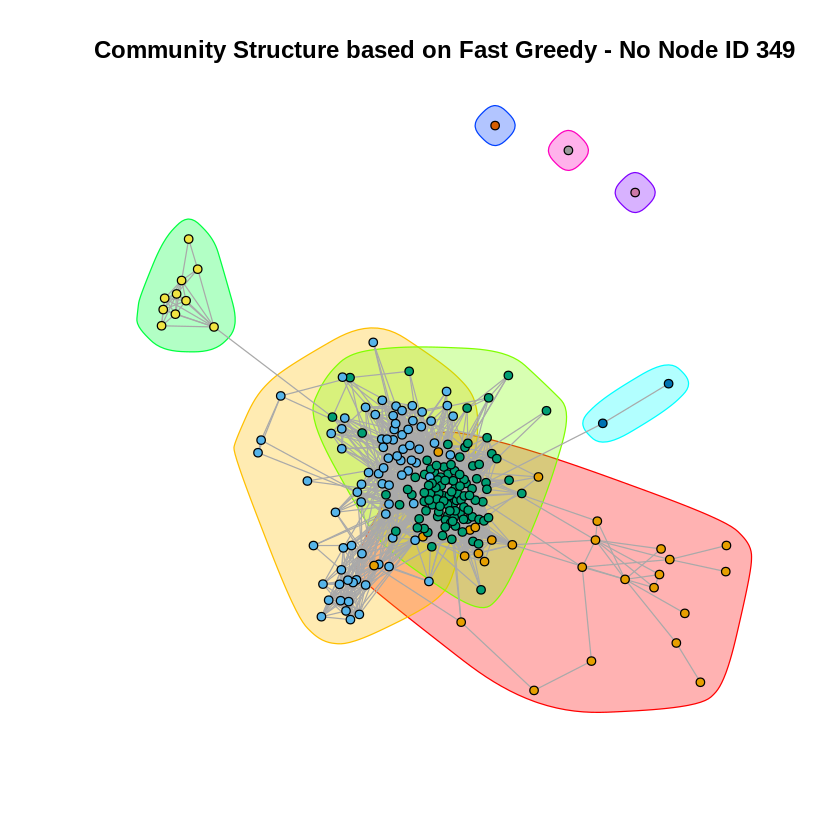

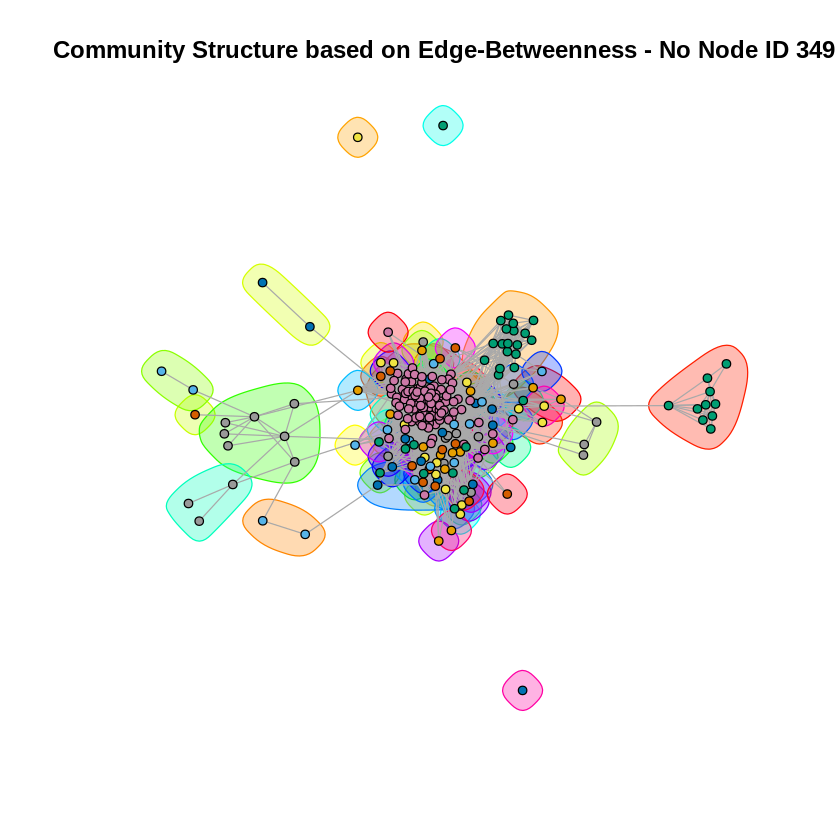

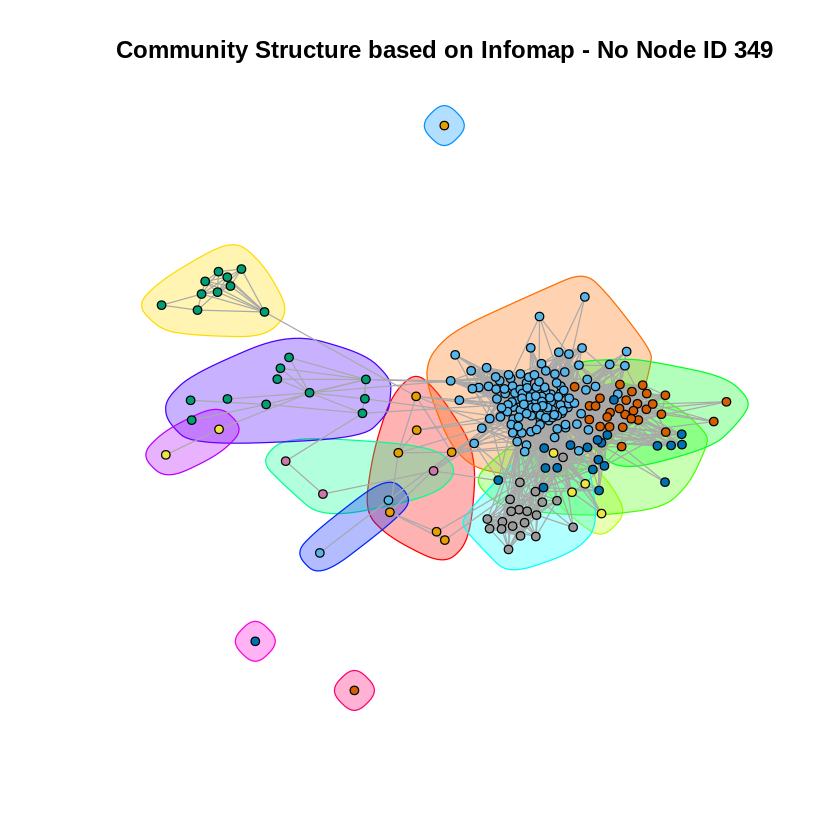

In [ ]:
# Node ID 349

# get the personalized network
id <- 349
g_noid <- induced_subgraph(g, neighbors(g, id))

# find community structure
fgc <- cluster_fast_greedy(g_noid)
ebc <- cluster_edge_betweenness(g_noid)
imc <- cluster_infomap(g_noid)

# modularity calculation
print(sprintf("Modularity with Fast-Greedy, without Node ID: %d: %f", id, modularity(fgc)))
print(sprintf("Modularity with Edge-Betweenness, without Node ID: %d: %f", id, modularity(ebc)))
print(sprintf("Modularity with Infomap, without Node ID: %d: %f", id, modularity(imc)))

# plot community structure
plot(g_noid, mark.groups=fgc, vertex.size=3, vertex.color=fgc$membership, vertex.label=NA, 
     main=sprintf("Community Structure based on Fast Greedy - No Node ID %d", id))
plot(g_noid, mark.groups=ebc, vertex.size=3, vertex.color=ebc$membership, vertex.label=NA, 
     main=sprintf("Community Structure based on Edge-Betweenness - No Node ID %d", id))
plot(g_noid, mark.groups=imc, vertex.size=3, vertex.color=imc$membership, vertex.label=NA, 
     main=sprintf("Community Structure based on Infomap - No Node ID %d", id))

[1] "Modularity with Fast-Greedy, without Node ID: 484: 0.534214"
[1] "Modularity with Edge-Betweenness, without Node ID: 484: 0.515441"
[1] "Modularity with Infomap, without Node ID: 484: 0.543444"


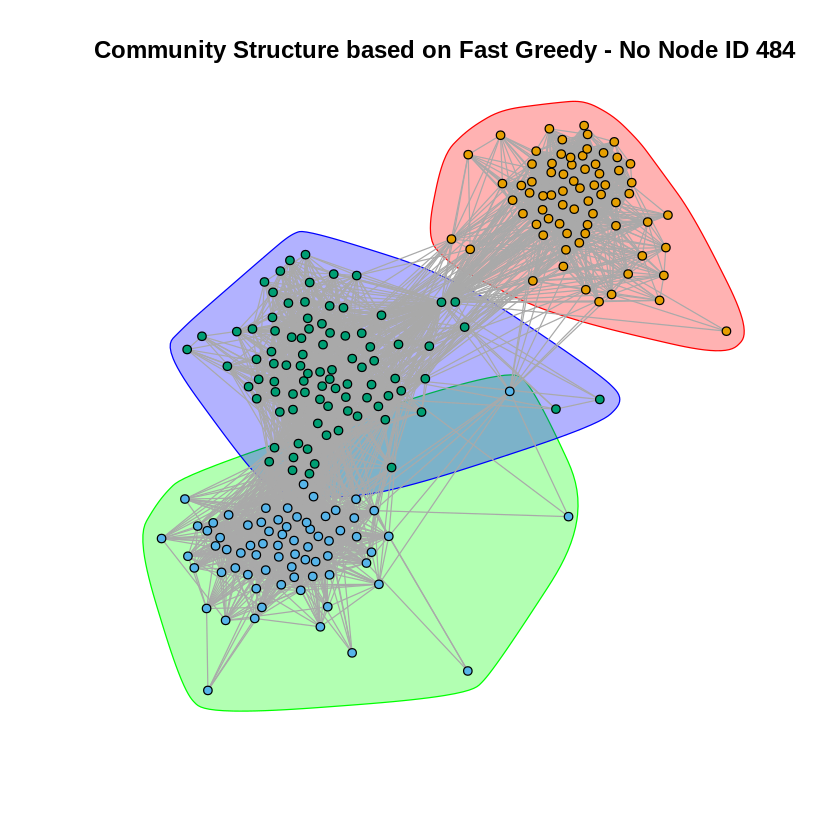

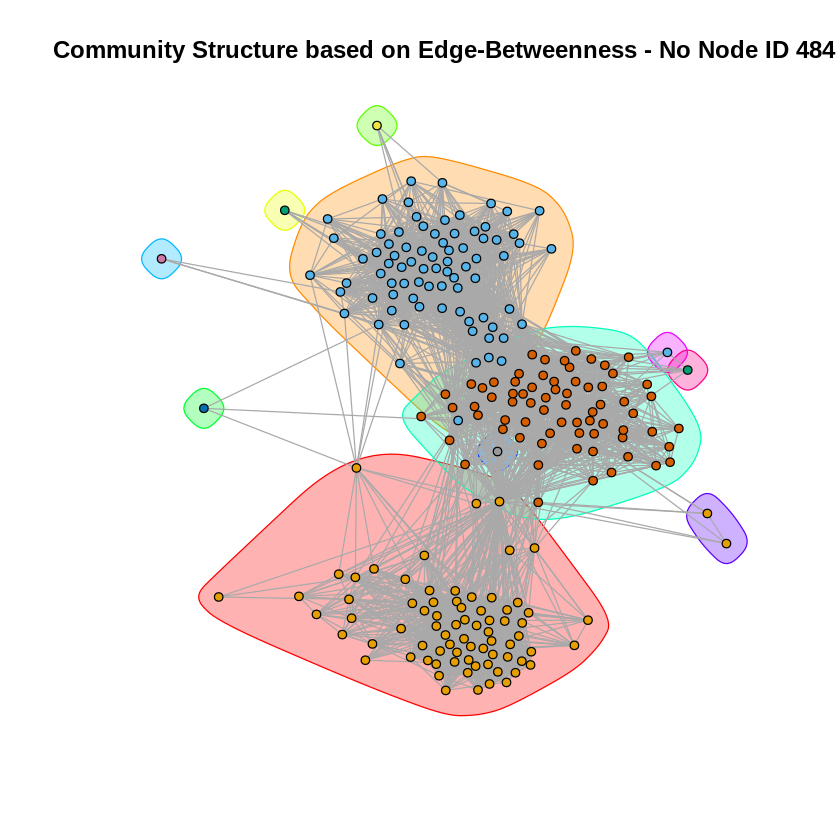

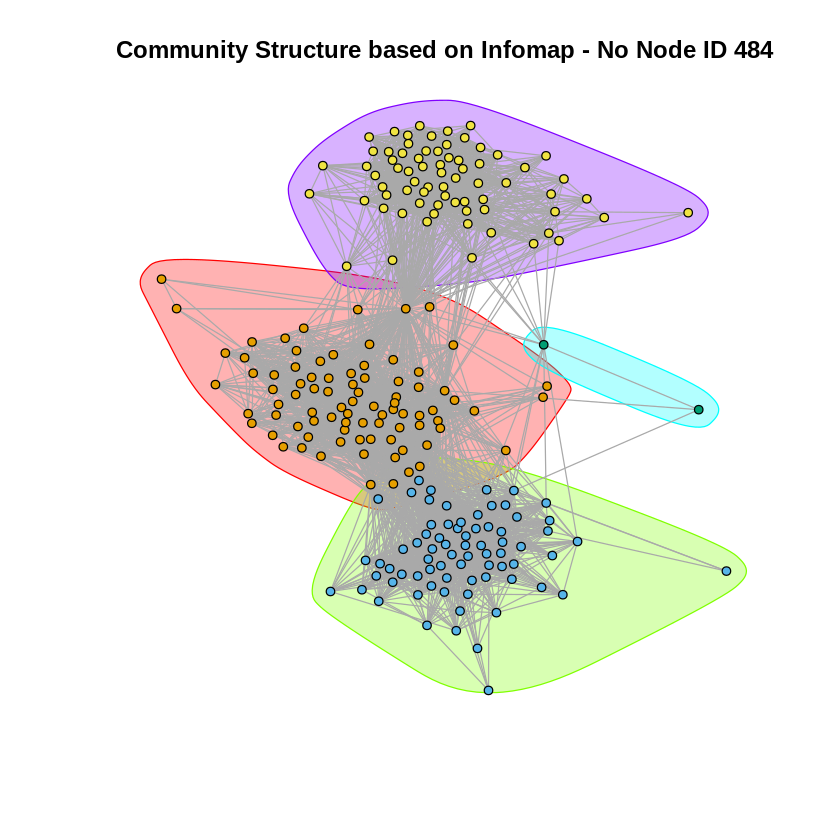

In [ ]:
# Node ID 484

# get the personalized network
id <- 484
g_noid <- induced_subgraph(g, neighbors(g, id))

# find community structure
fgc <- cluster_fast_greedy(g_noid)
ebc <- cluster_edge_betweenness(g_noid)
imc <- cluster_infomap(g_noid)

# modularity calculation
print(sprintf("Modularity with Fast-Greedy, without Node ID: %d: %f", id, modularity(fgc)))
print(sprintf("Modularity with Edge-Betweenness, without Node ID: %d: %f", id, modularity(ebc)))
print(sprintf("Modularity with Infomap, without Node ID: %d: %f", id, modularity(imc)))

# plot community structure
plot(g_noid, mark.groups=fgc, vertex.size=3, vertex.color=fgc$membership, vertex.label=NA, 
     main=sprintf("Community Structure based on Fast Greedy - No Node ID %d", id))
plot(g_noid, mark.groups=ebc, vertex.size=3, vertex.color=ebc$membership, vertex.label=NA, 
     main=sprintf("Community Structure based on Edge-Betweenness - No Node ID %d", id))
plot(g_noid, mark.groups=imc, vertex.size=3, vertex.color=imc$membership, vertex.label=NA, 
     main=sprintf("Community Structure based on Infomap - No Node ID %d", id))

[1] "Modularity with Fast-Greedy, without Node ID: 1087: 0.148196"
[1] "Modularity with Edge-Betweenness, without Node ID: 1087: 0.032495"
[1] "Modularity with Infomap, without Node ID: 1087: 0.027372"


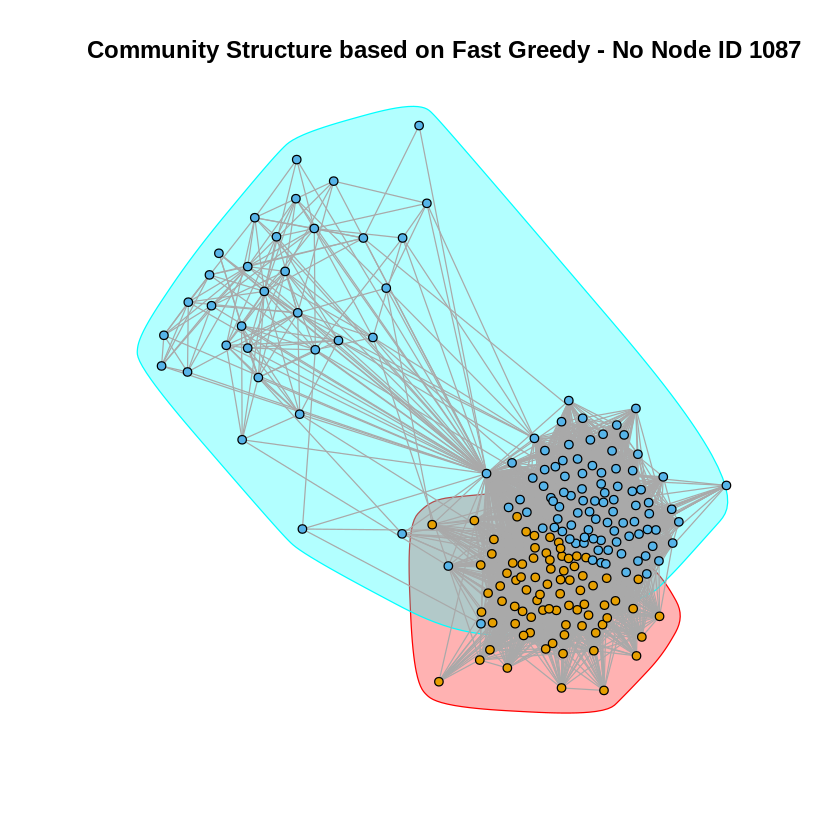

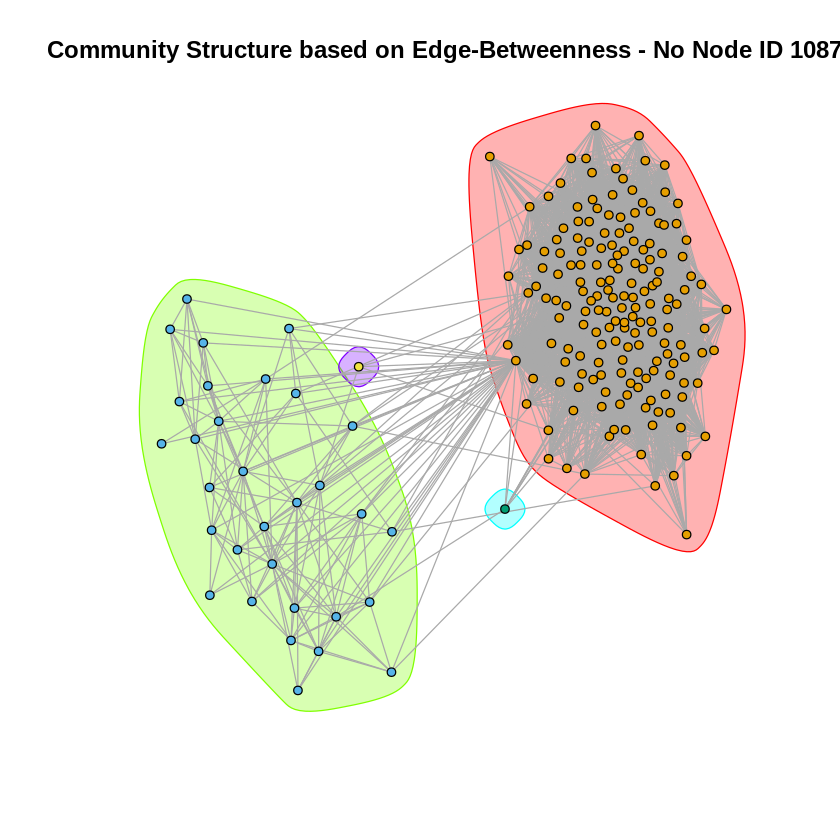

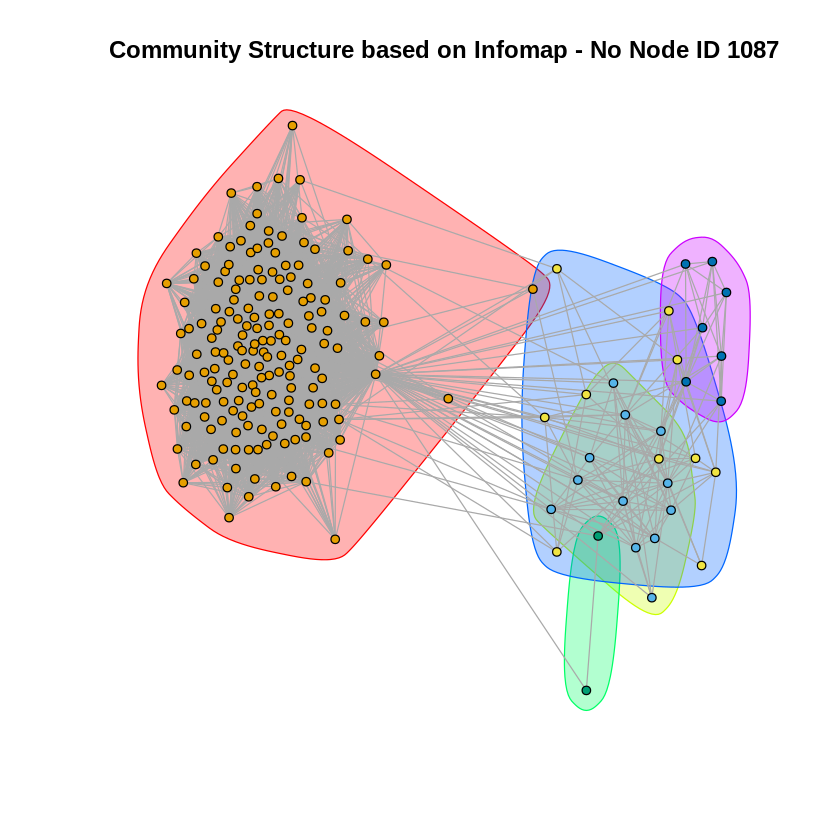

In [ ]:
# Node ID 1087

# get the personalized network
id <- 1087
g_noid <- induced_subgraph(g, neighbors(g, id))

# find community structure
fgc <- cluster_fast_greedy(g_noid)
ebc <- cluster_edge_betweenness(g_noid)
imc <- cluster_infomap(g_noid)

# modularity calculation
print(sprintf("Modularity with Fast-Greedy, without Node ID: %d: %f", id, modularity(fgc)))
print(sprintf("Modularity with Edge-Betweenness, without Node ID: %d: %f", id, modularity(ebc)))
print(sprintf("Modularity with Infomap, without Node ID: %d: %f", id, modularity(imc)))

# plot community structure
plot(g_noid, mark.groups=fgc, vertex.size=3, vertex.color=fgc$membership, vertex.label=NA, 
     main=sprintf("Community Structure based on Fast Greedy - No Node ID %d", id))
plot(g_noid, mark.groups=ebc, vertex.size=3, vertex.color=ebc$membership, vertex.label=NA, 
     main=sprintf("Community Structure based on Edge-Betweenness - No Node ID %d", id))
plot(g_noid, mark.groups=imc, vertex.size=3, vertex.color=imc$membership, vertex.label=NA, 
     main=sprintf("Community Structure based on Infomap - No Node ID %d", id))

<div class="alert alert-block alert-success">
<b>Answer 10:</b> The results of the community structures and the mudularity scores of each Node ID are reported above. Similar results as in Q9 could be observed. Overall, the personalized network of node ID 484 achieve the highest modularity score in Fast-Greedy and Infomap algorithms and node ID 108 in Edge-Betweenness algorithm. On the other hand, the personal network with node ID 1087 still has the lowest modularity score in each algorithm. Interesting at here is that if we compare the results in Q9 and Q10, one can see that the modularity scores increase after removing the core node for all 5 personalized networks. This is due to the fact that the core node connects all other nodes in the network which causes difficulties in the network to be partitioned into communities with strong intra-community connectedness and sparse inter-community connectedness. Therefore, the network without the core node, in general, achieves higher modularity score.
</div>

### 3.3. Characteristic of nodes in the personalized network

<div class="alert alert-block alert-success">
<b>Question 11:</b> Write an expression relating the Embeddedness between the core node and a non-core node to the degree of the non-core node in the personalized network of the core node.
</div>


<div class="alert alert-block alert-success">
<b>Answer 11:</b> According to the project guideline, embeddedness of a node is defined as the number of mutual friends a node shares with
the core node. Since each random node in the personalized network is a neighbor(friend) of the core node with a distance 1, the embeddedness of a node is all neighboring nodes connected with this node with a distance equal to 1 besides the core node itself. This could be express as:

$$
\text{embed}(v_{i}, v_{core}) = \text{degree}(v_{i}) - 1
$$
</div>

<div class="alert alert-block alert-success">
<b>Question 12:</b> For each of the core node’s personalized network (use the same core nodes as Question 9), plot the distribution histogram of embeddedness and dispersion. In this question, you will have 10 plots.
</div>


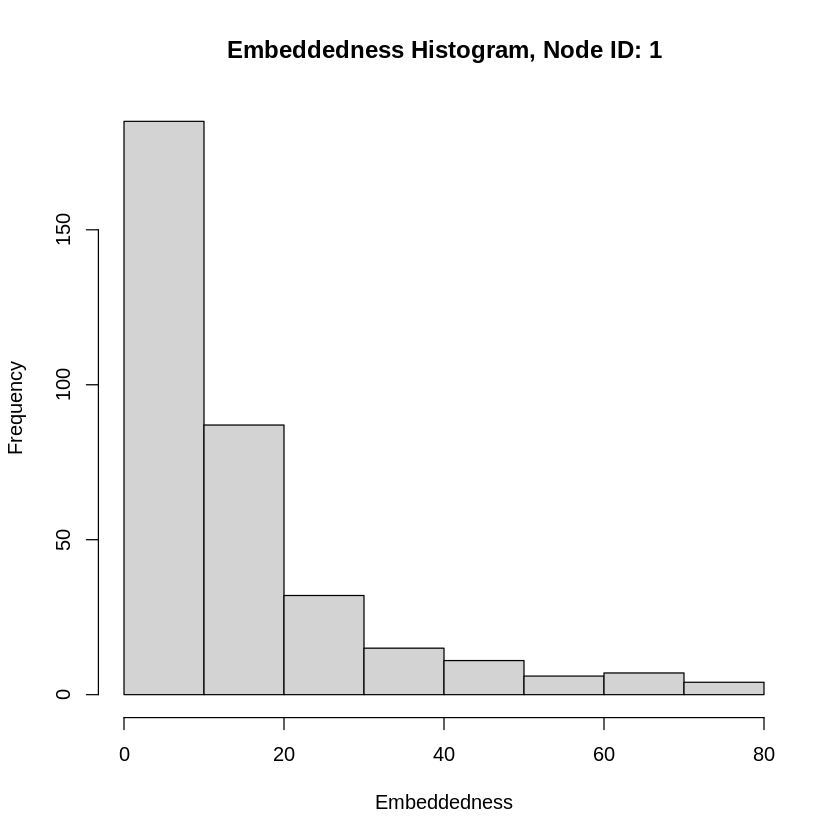

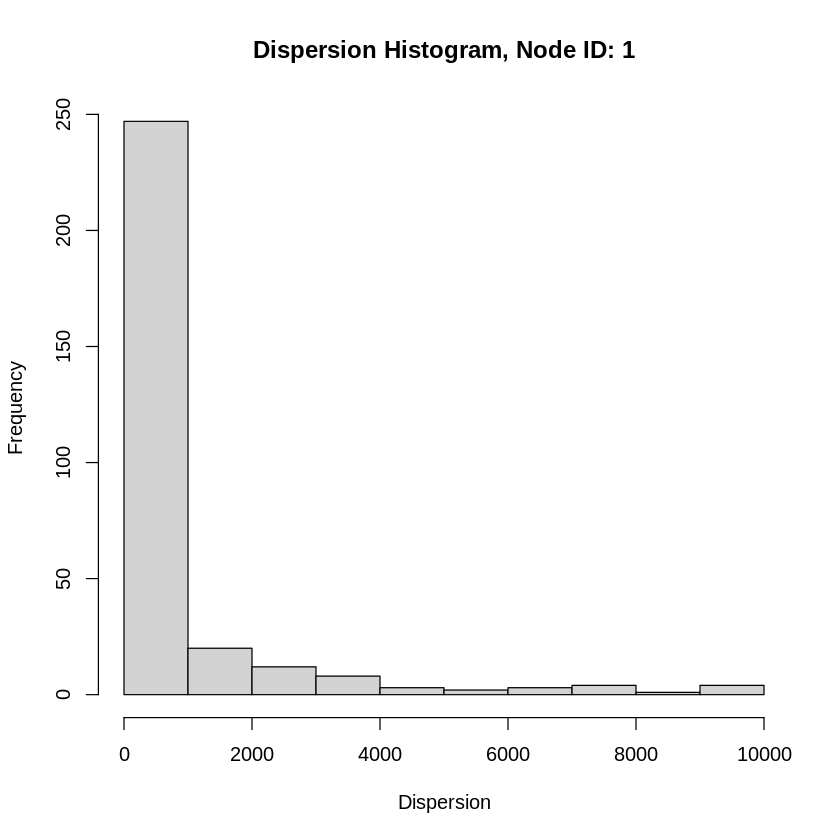

In [ ]:
# Node ID 1

# read the fb data
fb_txt <- read.table("facebook_combined.txt",header=F)
g <- graph.data.frame(fb_txt, directed=F)


# get the personalized network
core_id <- "0"
neighbor_nodes <- unlist(ego(g, order=1, nodes=core_id))
g_core <- induced.subgraph(g, neighbor_nodes)
g_core$name <- sort(neighbor_nodes)

# init
embeds <- c()
disp <- c()

# start iterate through all neighboring node
neighbor_nodes <- vertex_attr(g_core)$name
for (i in seq_along(neighbor_nodes)) { 
  v <- neighbor_nodes[i]
  if (v==core_id) {
    next
  }
  
  # calculate the embeddedness
  core_neighbors <- neighbors(g_core, core_id)
  target_neighbors <- neighbors(g_core, v)
  inter <- intersection(core_neighbors, target_neighbors)
  embeds[i] <- length(inter)
  
  # calculate the dispersion
  g_modified <- delete.vertices(g_core, c(core_id, v))
  if (embeds[i] > 1) {
    inter_ver <- c(inter$name)
    vtoids <- c()
    for(m in 1:length(inter_ver)){
      vtoids <- c(vtoids, which(vertex_attr(g_modified)$name==inter_ver[m]))
    }
    # get sum of distances
    disp_mat <- distances(g_modified, v=vtoids, to=vtoids)
    disp_mat[disp_mat==Inf] <- diameter(g_modified)+1
    disp[i] <- sum(disp_mat)
  }    
}

# plot
hist(embeds, xlab="Embeddedness", ylab="Frequency",
     main=sprintf("Embeddedness Histogram, Node ID: %d", strtoi(core_id)+1))
hist(disp, xlab="Dispersion", ylab="Frequency", 
     main=sprintf("Dispersion Histogram, Node ID: %d", strtoi(core_id)+1))

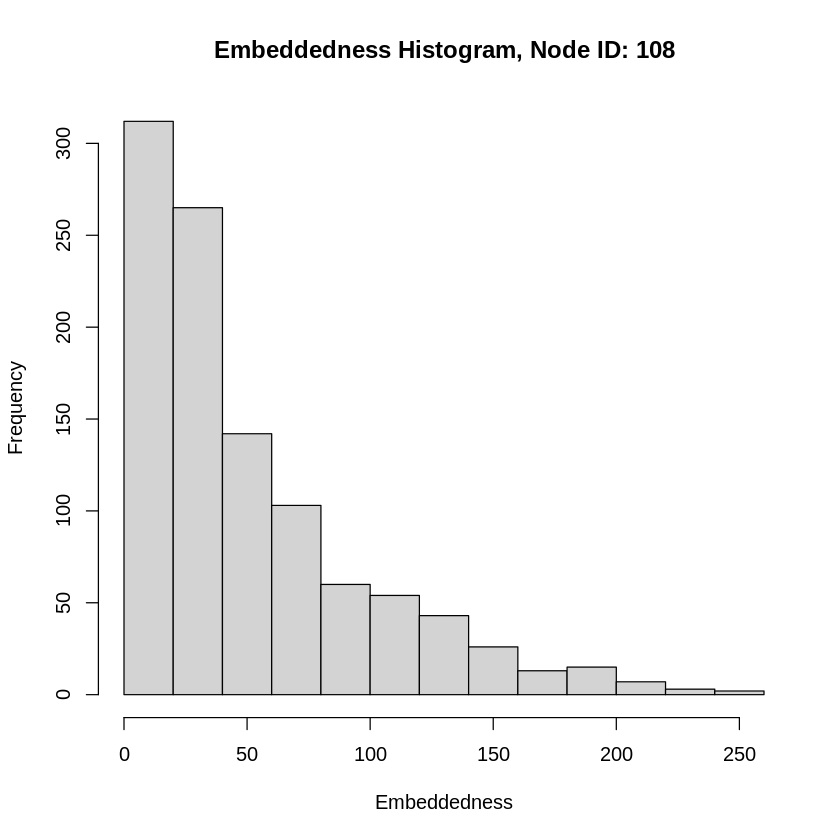

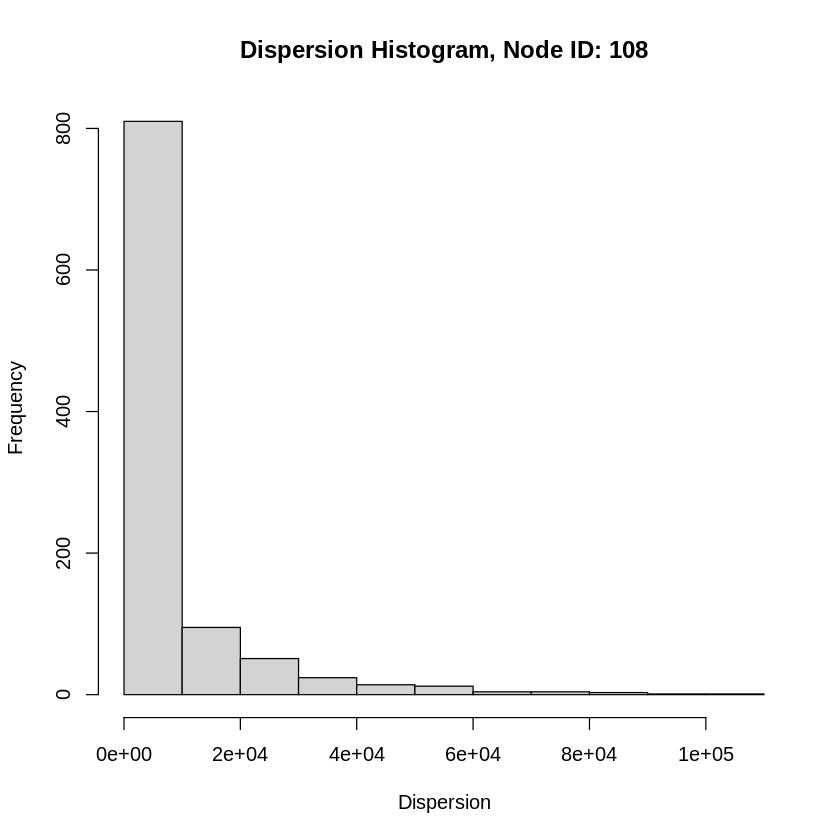

In [ ]:
# Node ID 108

# read the fb data
fb_txt <- read.table("facebook_combined.txt",header=F)
g <- graph.data.frame(fb_txt, directed=F)


# get the personalized network
core_id <- "107"
neighbor_nodes <- unlist(ego(g, order=1, nodes=core_id))
g_core <- induced.subgraph(g, neighbor_nodes)
g_core$name <- sort(neighbor_nodes)

# init
embeds <- c()
disp <- c()

# start iterate through all neighboring node
neighbor_nodes <- vertex_attr(g_core)$name
for (i in seq_along(neighbor_nodes)) { 
  v <- neighbor_nodes[i]
  if (v==core_id) {
    next
  }
  
  # calculate the embeddedness
  core_neighbors <- neighbors(g_core, core_id)
  target_neighbors <- neighbors(g_core, v)
  inter <- intersection(core_neighbors, target_neighbors)
  embeds[i] <- length(inter)
  
  # calculate the dispersion
  g_modified <- delete.vertices(g_core, c(core_id, v))
  if (embeds[i] > 1) {
    inter_ver <- c(inter$name)
    vtoids <- c()
    for(m in 1:length(inter_ver)){
      vtoids <- c(vtoids, which(vertex_attr(g_modified)$name==inter_ver[m]))
    }
    # get sum of distances
    disp_mat <- distances(g_modified, v=vtoids, to=vtoids)
    disp_mat[disp_mat==Inf] <- diameter(g_modified)+1
    disp[i] <- sum(disp_mat)
  }    
}

# plot
hist(embeds, xlab="Embeddedness", ylab="Frequency",
     main=sprintf("Embeddedness Histogram, Node ID: %d", strtoi(core_id)+1))
hist(disp, xlab="Dispersion", ylab="Frequency", 
     main=sprintf("Dispersion Histogram, Node ID: %d", strtoi(core_id)+1))

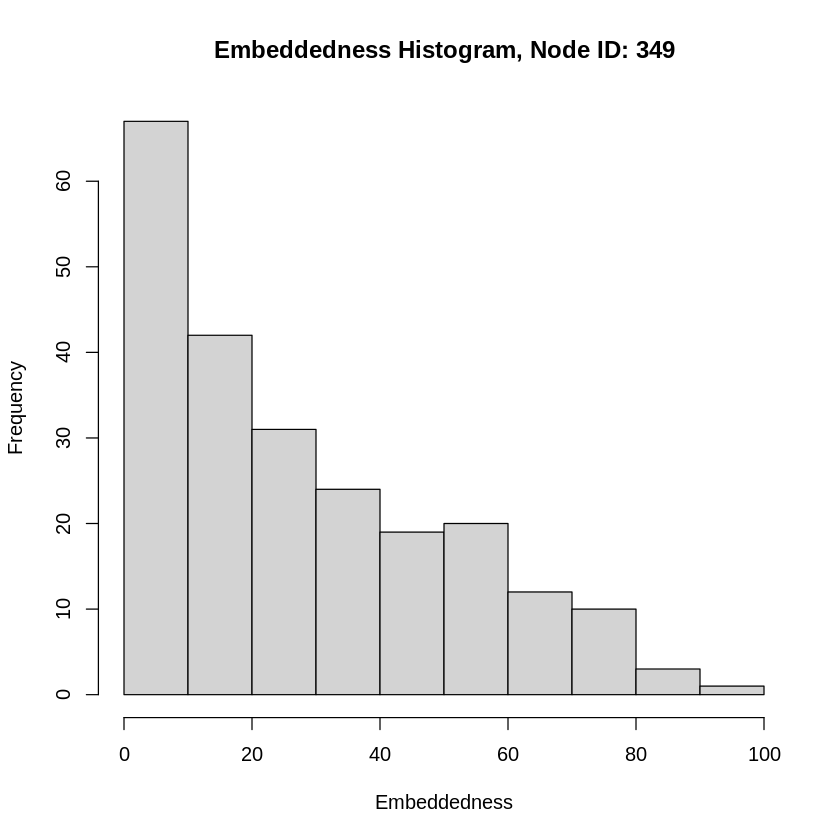

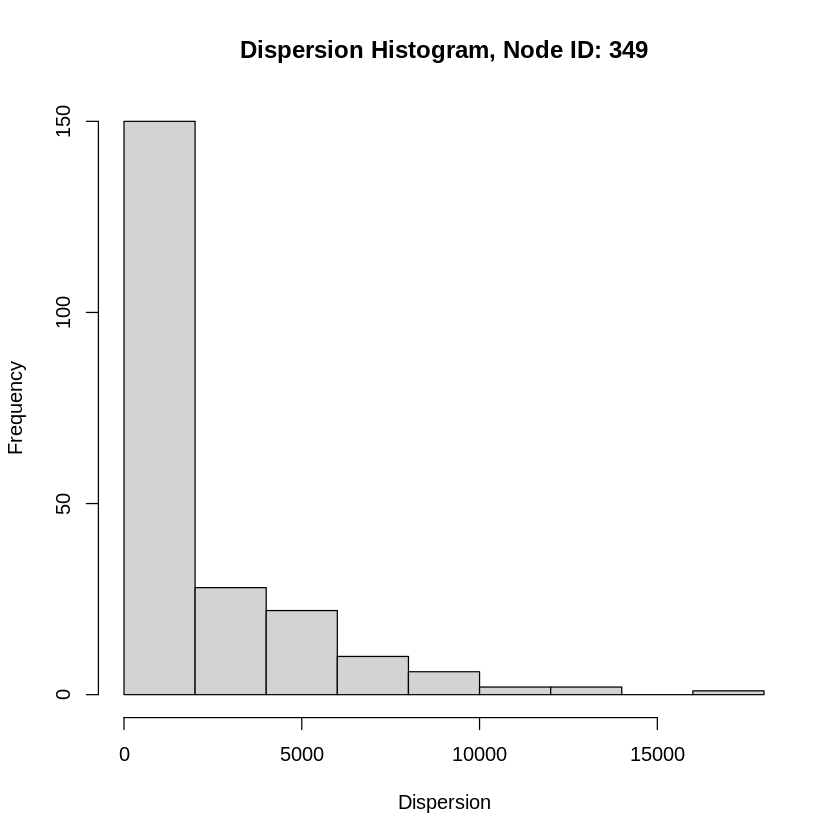

In [ ]:
# Node ID 349

# read the fb data
fb_txt <- read.table("facebook_combined.txt",header=F)
g <- graph.data.frame(fb_txt, directed=F)


# get the personalized network
core_id <- "348"
neighbor_nodes <- unlist(ego(g, order=1, nodes=core_id))
g_core <- induced.subgraph(g, neighbor_nodes)
g_core$name <- sort(neighbor_nodes)

# init
embeds <- c()
disp <- c()

# start iterate through all neighboring node
neighbor_nodes <- vertex_attr(g_core)$name
for (i in seq_along(neighbor_nodes)) { 
  v <- neighbor_nodes[i]
  if (v==core_id) {
    next
  }
  
  # calculate the embeddedness
  core_neighbors <- neighbors(g_core, core_id)
  target_neighbors <- neighbors(g_core, v)
  inter <- intersection(core_neighbors, target_neighbors)
  embeds[i] <- length(inter)
  
  # calculate the dispersion
  g_modified <- delete.vertices(g_core, c(core_id, v))
  if (embeds[i] > 1) {
    inter_ver <- c(inter$name)
    vtoids <- c()
    for(m in 1:length(inter_ver)){
      vtoids <- c(vtoids, which(vertex_attr(g_modified)$name==inter_ver[m]))
    }
    # get sum of distances
    disp_mat <- distances(g_modified, v=vtoids, to=vtoids)
    disp_mat[disp_mat==Inf] <- diameter(g_modified)+1
    disp[i] <- sum(disp_mat)
  }    
}

# plot
hist(embeds, xlab="Embeddedness", ylab="Frequency",
     main=sprintf("Embeddedness Histogram, Node ID: %d", strtoi(core_id)+1))
hist(disp, xlab="Dispersion", ylab="Frequency", 
     main=sprintf("Dispersion Histogram, Node ID: %d", strtoi(core_id)+1))

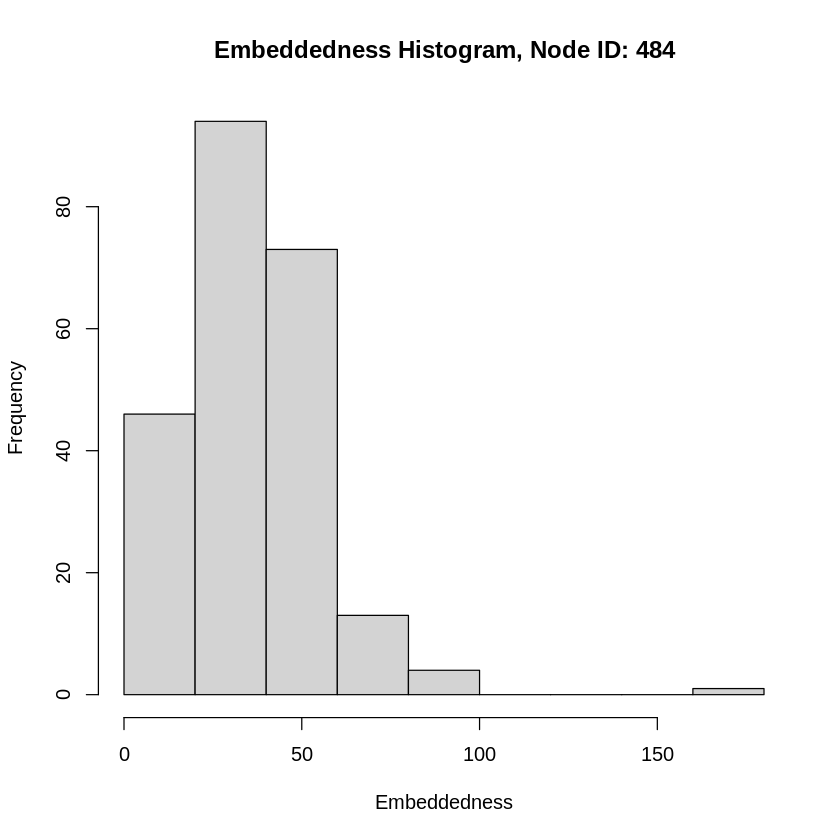

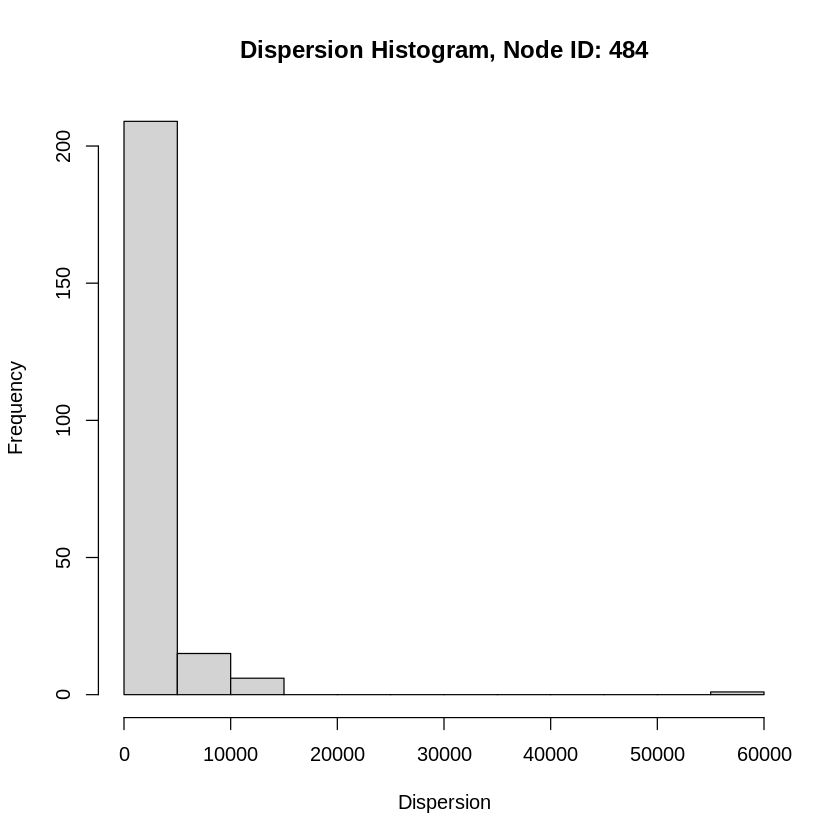

In [ ]:
# Node ID 484

# read the fb data
fb_txt <- read.table("facebook_combined.txt",header=F)
g <- graph.data.frame(fb_txt, directed=F)


# get the personalized network
core_id <- "483"
neighbor_nodes <- unlist(ego(g, order=1, nodes=core_id))
g_core <- induced.subgraph(g, neighbor_nodes)
g_core$name <- sort(neighbor_nodes)

# init
embeds <- c()
disp <- c()

# start iterate through all neighboring node
neighbor_nodes <- vertex_attr(g_core)$name
for (i in seq_along(neighbor_nodes)) { 
  v <- neighbor_nodes[i]
  if (v==core_id) {
    next
  }
  
  # calculate the embeddedness
  core_neighbors <- neighbors(g_core, core_id)
  target_neighbors <- neighbors(g_core, v)
  inter <- intersection(core_neighbors, target_neighbors)
  embeds[i] <- length(inter)
  
  # calculate the dispersion
  g_modified <- delete.vertices(g_core, c(core_id, v))
  if (embeds[i] > 1) {
    inter_ver <- c(inter$name)
    vtoids <- c()
    for(m in 1:length(inter_ver)){
      vtoids <- c(vtoids, which(vertex_attr(g_modified)$name==inter_ver[m]))
    }
    # get sum of distances
    disp_mat <- distances(g_modified, v=vtoids, to=vtoids)
    disp_mat[disp_mat==Inf] <- diameter(g_modified)+1
    disp[i] <- sum(disp_mat)
  }    
}

# plot
hist(embeds, xlab="Embeddedness", ylab="Frequency",
     main=sprintf("Embeddedness Histogram, Node ID: %d", strtoi(core_id)+1))
hist(disp, xlab="Dispersion", ylab="Frequency", 
     main=sprintf("Dispersion Histogram, Node ID: %d", strtoi(core_id)+1))

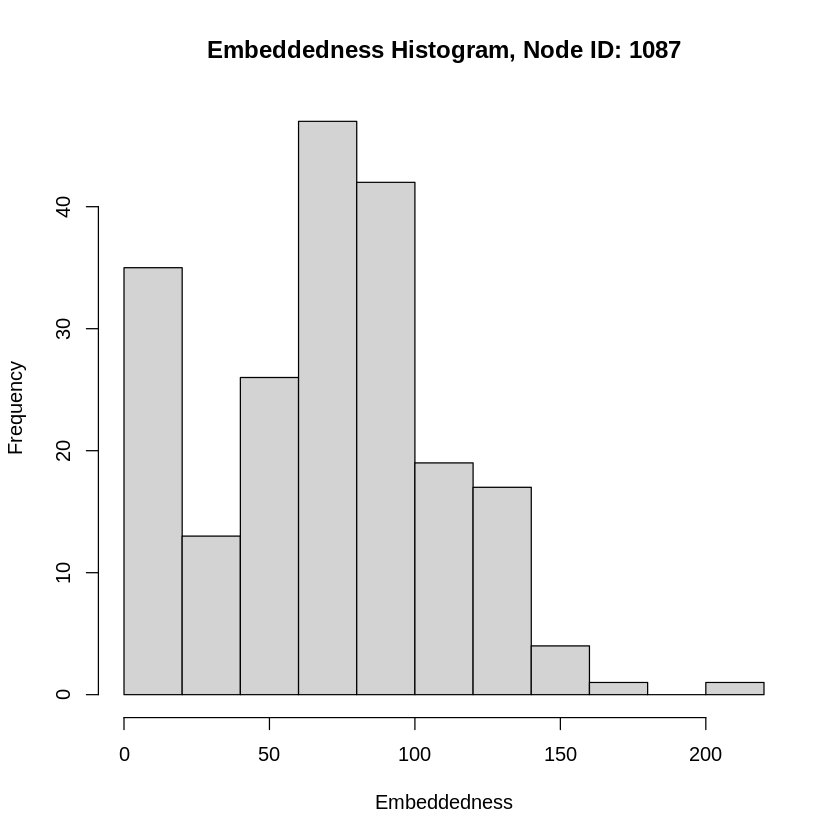

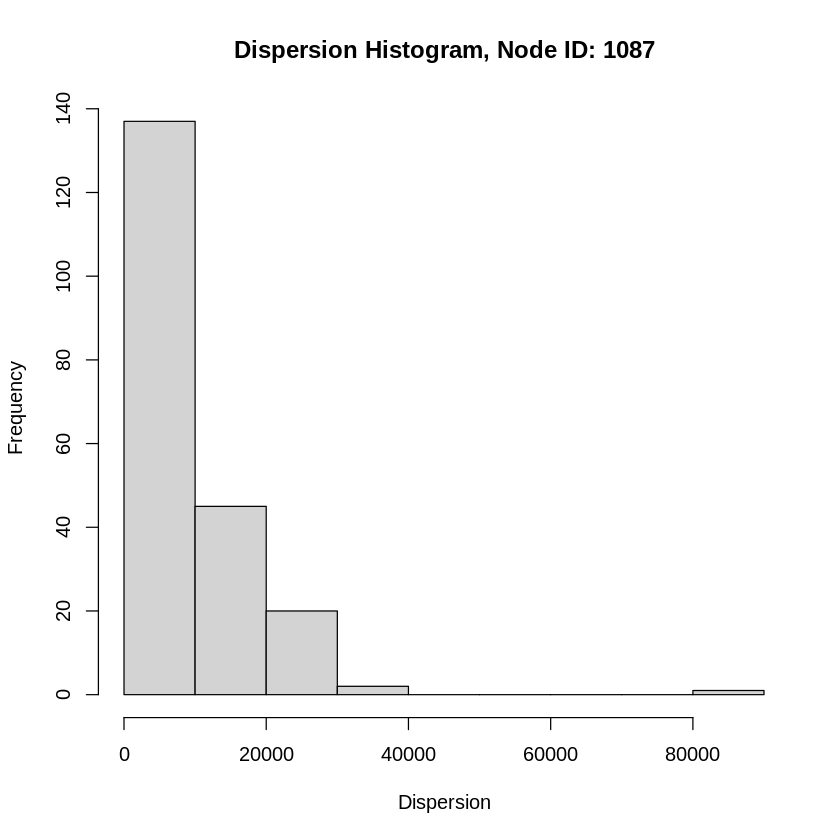

In [ ]:
# Node ID 1087

# read the fb data
fb_txt <- read.table("facebook_combined.txt",header=F)
g <- graph.data.frame(fb_txt, directed=F)


# get the personalized network
core_id <- "1086"
neighbor_nodes <- unlist(ego(g, order=1, nodes=core_id))
g_core <- induced.subgraph(g, neighbor_nodes)
g_core$name <- sort(neighbor_nodes)

# init
embeds <- c()
disp <- c()

# start iterate through all neighboring node
neighbor_nodes <- vertex_attr(g_core)$name
for (i in seq_along(neighbor_nodes)) { 
  v <- neighbor_nodes[i]
  if (v==core_id) {
    next
  }
  
  # calculate the embeddedness
  core_neighbors <- neighbors(g_core, core_id)
  target_neighbors <- neighbors(g_core, v)
  inter <- intersection(core_neighbors, target_neighbors)
  embeds[i] <- length(inter)
  
  # calculate the dispersion
  g_modified <- delete.vertices(g_core, c(core_id, v))
  if (embeds[i] > 1) {
    inter_ver <- c(inter$name)
    vtoids <- c()
    for(m in 1:length(inter_ver)){
      vtoids <- c(vtoids, which(vertex_attr(g_modified)$name==inter_ver[m]))
    }
    # get sum of distances
    disp_mat <- distances(g_modified, v=vtoids, to=vtoids)
    disp_mat[disp_mat==Inf] <- diameter(g_modified)+1
    disp[i] <- sum(disp_mat)
  }    
}

# plot
hist(embeds, xlab="Embeddedness", ylab="Frequency",
     main=sprintf("Embeddedness Histogram, Node ID: %d", strtoi(core_id)+1))
hist(disp, xlab="Dispersion", ylab="Frequency", 
     main=sprintf("Dispersion Histogram, Node ID: %d", strtoi(core_id)+1))

<div class="alert alert-block alert-success">
<b>Answer 12:</b> The results are shown above.
</div>

<div class="alert alert-block alert-success">
<b>Question 13:</b> For each of the core node’s personalized network, plot the community structure of the personalized network using colors and highlight the node with maximum dispersion. Also, highlight the edges incident to this node. To detect the community structure, use Fast-Greedy algorithm. In this question, you will have 5 plots.
</div>


<div class="alert alert-block alert-success">
<b>Question 14:</b> Repeat Question 13, but now highlight the node with maximum embeddedness and the node with maximum $\frac{\text{dispersion}}{\text{embeddedness}}$ (excluding the nodes having zero embeddedness if there are any). Also, highlight the edges incident to these nodes. Report the id of those nodes.
</div>


[1] "ID of node with max. embeddedness for core node ID 1: 49"
[1] "ID of node with max. ratio for core node with ID 1: 21"


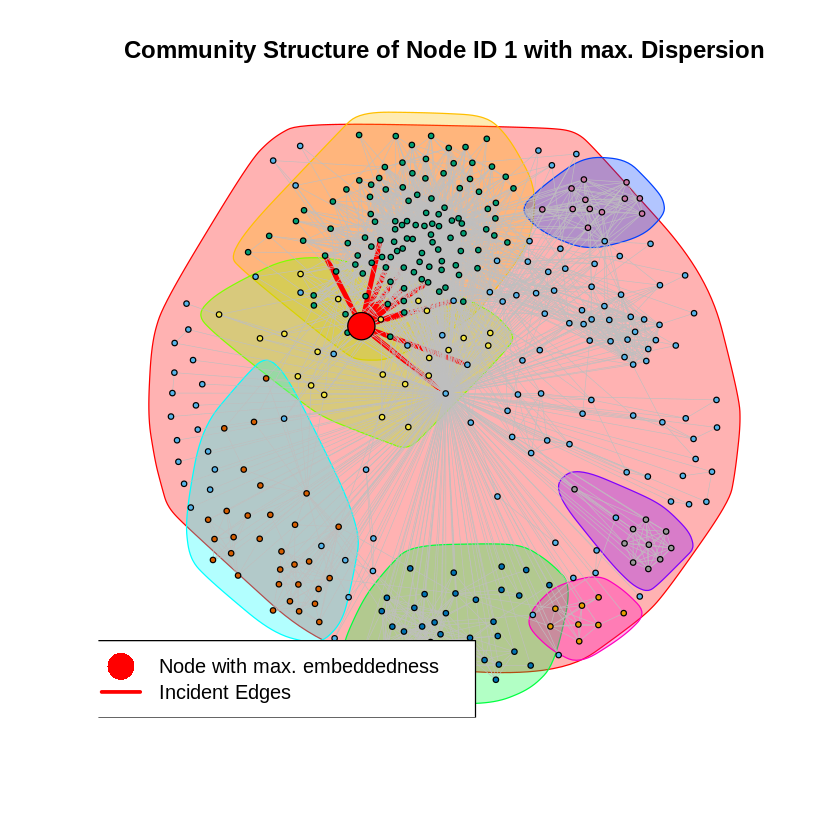

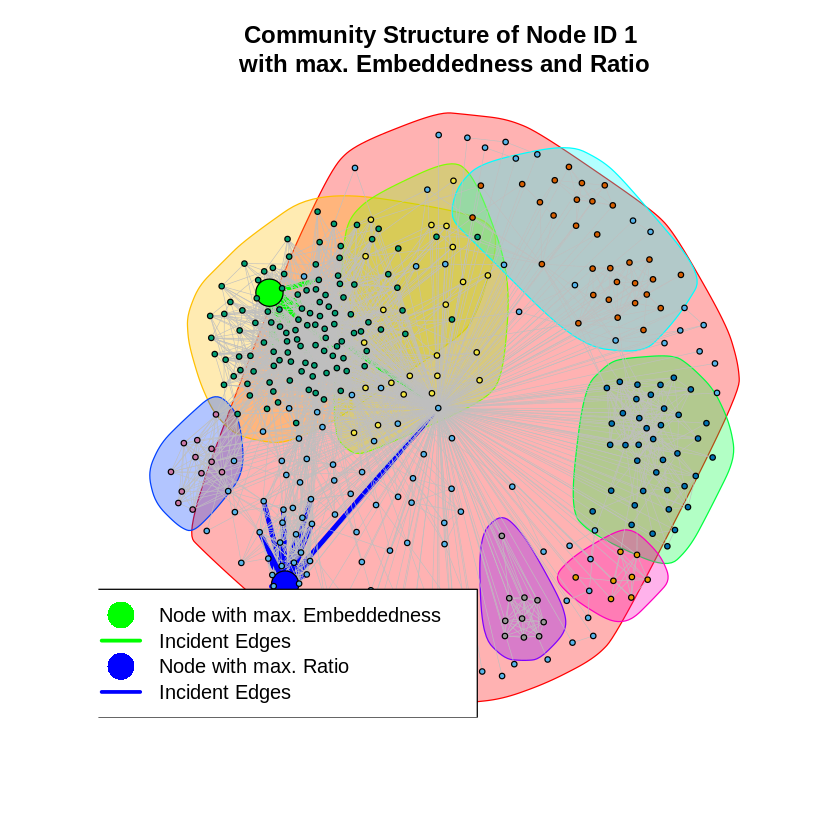

[1] "ID of node with max. embeddedness for core node ID 108: 977"
[1] "ID of node with max. ratio for core node with ID 108: 969"


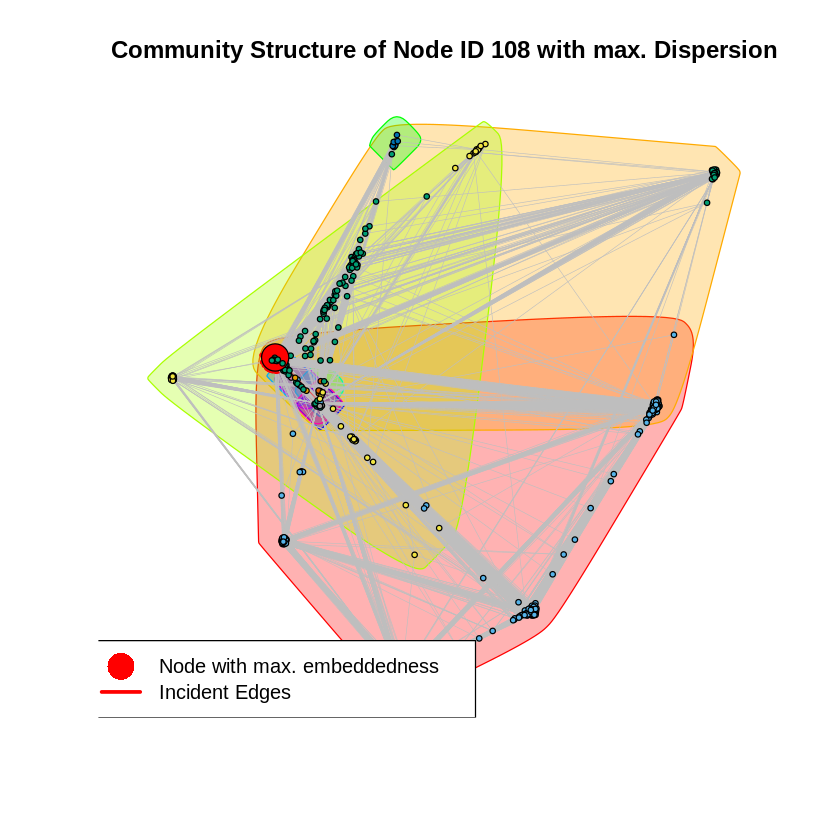

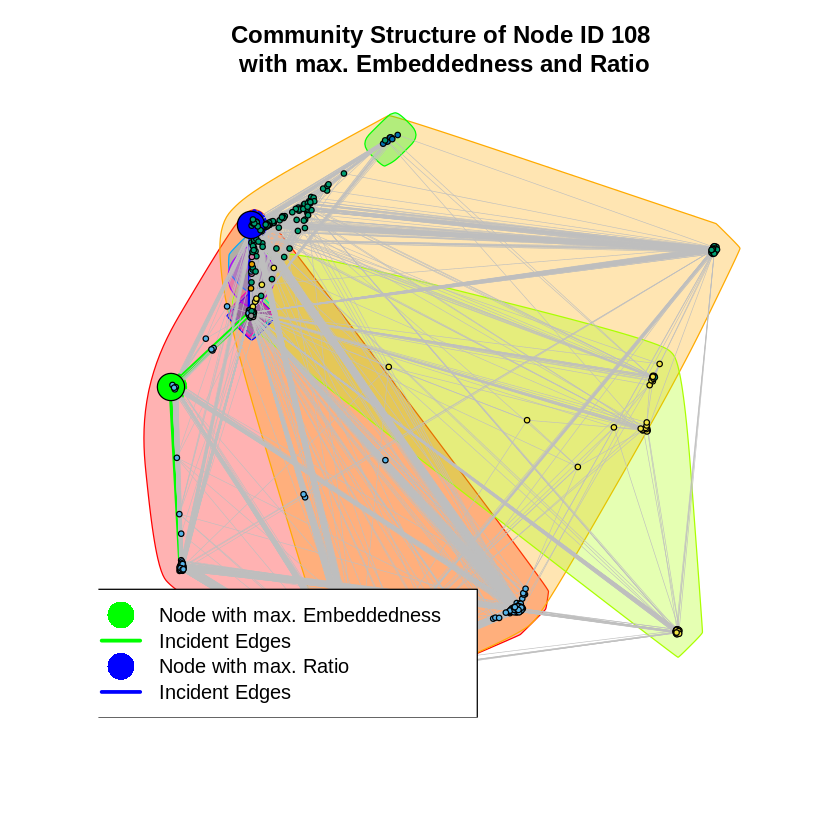

[1] "ID of node with max. embeddedness for core node ID 349: 31"
[1] "ID of node with max. ratio for core node with ID 349: 31"


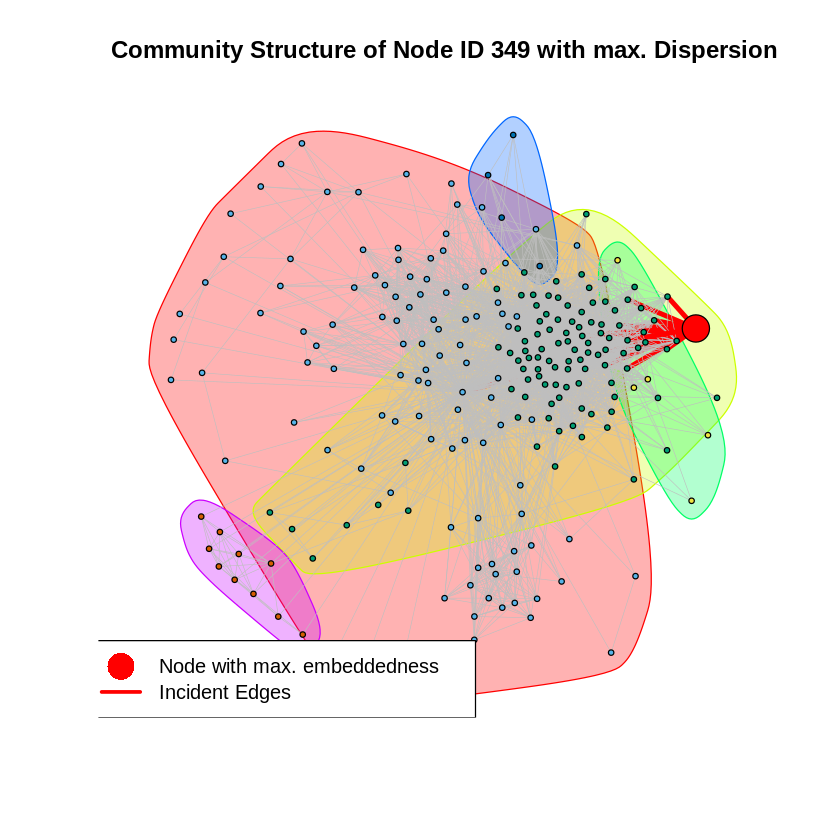

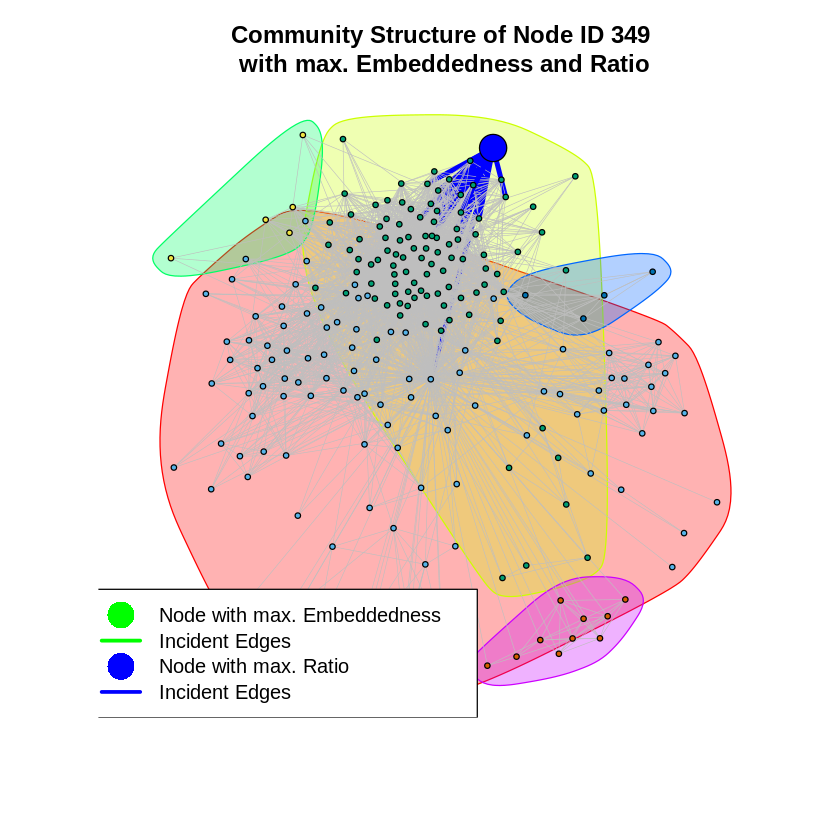

[1] "ID of node with max. embeddedness for core node ID 484: 1"
[1] "ID of node with max. ratio for core node with ID 484: 1"


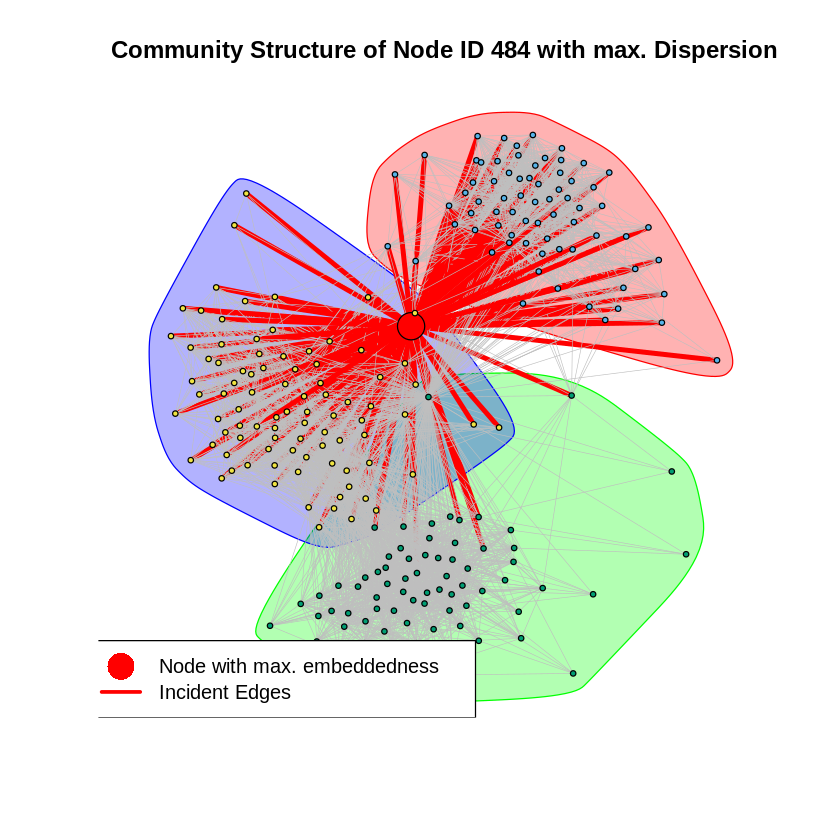

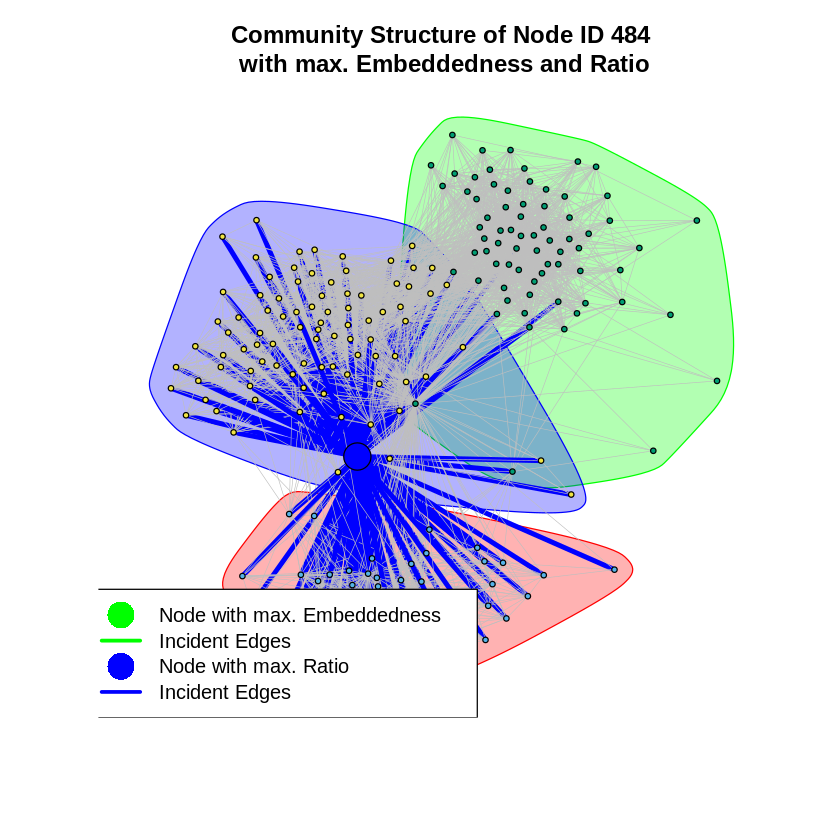

[1] "ID of node with max. embeddedness for core node ID 1087: 1"
[1] "ID of node with max. ratio for core node with ID 1087: 1"


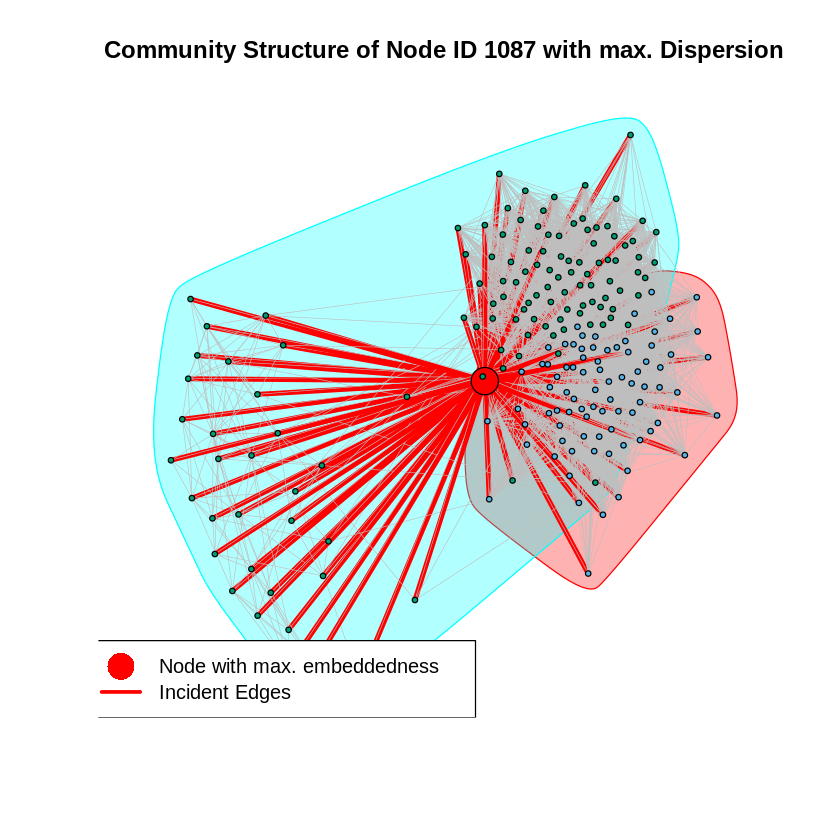

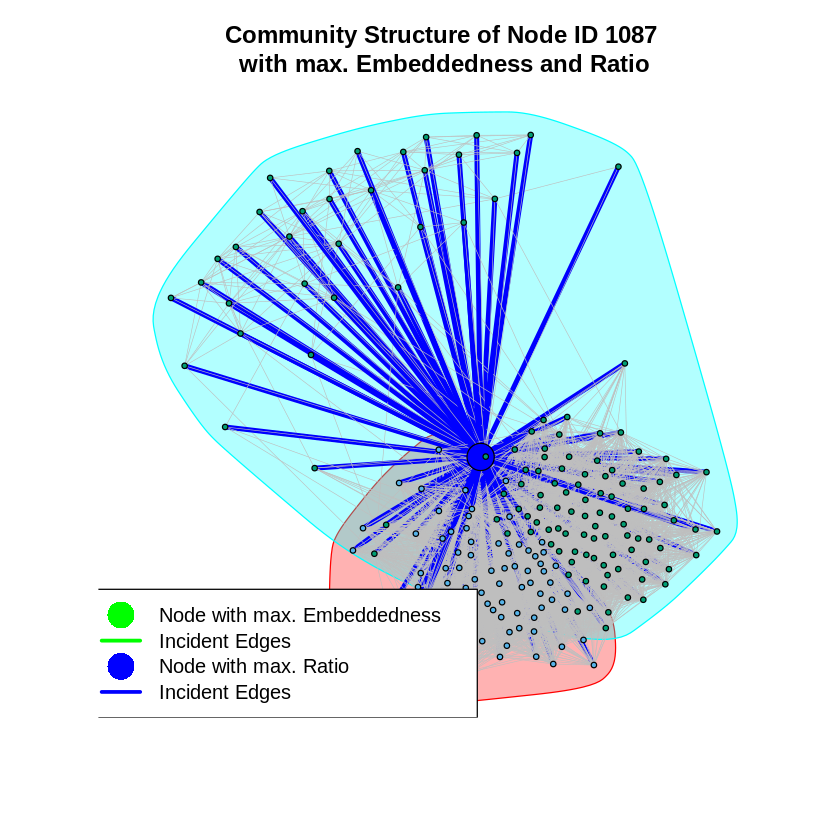

In [ ]:
# read the fb data
fb_txt <- read.table("facebook_combined.txt",header=F)
g <- graph.data.frame(fb_txt, directed=F)
core_ids = c("0", "107", "348", "483","1086")

for (core_id in core_ids) {
  # get the personalized network
  neighbor_nodes <- unlist(ego(g, order=1, nodes=core_id))
  g_core <- induced.subgraph(g, neighbor_nodes)
  g_core$name <- sort(neighbor_nodes)

  # init
  embeds <- c()
  disp <- c()

  # start iterate through all neighboring node
  neighbor_nodes <- vertex_attr(g_core)$name
  for (i in seq_along(neighbor_nodes)) { 
    v <- neighbor_nodes[i]
    if (v==core_id) {
      next
    }
    
    # calculate the embeddedness
    core_neighbors <- neighbors(g_core, core_id)
    target_neighbors <- neighbors(g_core, v)
    inter <- intersection(core_neighbors, target_neighbors)
    embeds[i] <- length(inter)
    
    # calculate the dispersion
    g_modified <- delete.vertices(g_core, c(core_id, v))
    if (embeds[i] > 1) {
      inter_ver <- c(inter$name)
      vtoids <- c()
      for(m in 1:length(inter_ver)){
        vtoids <- c(vtoids, which(vertex_attr(g_modified)$name==inter_ver[m]))
      }
      # get sum of distances
      disp_mat <- distances(g_modified, v=vtoids, to=vtoids)
      disp_mat[is.infinite(disp_mat)] <- NA
      disp[i] <- sum(disp_mat, na.rm=T)
    } else {
      disp[i] <- NA
    }
  }

  fgc <- cluster_fast_greedy(g_core)

  # ============================ Question 13 =====================================
  # get the max dispersion and the node ID
  disp_rmna <- disp[which(disp != "<NA>")]
  maxdisp <- g_core$name[which(disp_rmna==max(disp_rmna))]
  maxnode <- which(g_core$name==maxdisp)

  vert_color <- fgc$membership + 1
  vert_color[maxnode] <- "red"
  vert_size <- rep(2, length(vert_color))
  vert_size[maxnode] <- 10

  edge_color <- rep("grey", length(E(g_core)))
  edge_color[which(get.edgelist(g_core, name = FALSE)[,1] == maxnode | 
          get.edgelist(g_core, name = FALSE)[,2] == maxnode)] <- "red"
  edge_wid <- rep(0.5, length(E(g_core)))
  edge_wid[which(get.edgelist(g_core, name = FALSE)[,1] == maxnode |  
          get.edgelist(g_core, name = FALSE)[,2] == maxnode)] <- 4

  # plot
  plot(g_core, mark.groups=fgc, vertex.color=vert_color, vertex.size=vert_size, 
      edge.color=edge_color, edge.width=edge_wid, vertex.label=NA,
      main = sprintf("Community Structure of Node ID %d with max. Dispersion", 
                      strtoi(core_id)+1))
  legend('bottomleft', legend=c("Node with max. embeddedness", "Incident Edges"),
        col=c("red", "red"), lty=c(0, 1), lwd=c(5, 3), pch=c(16, NA), pt.cex=3)

  # ============================ Question 14 part 1 ==============================
  embeds_rmna <- embeds[which(embeds != "<NA>")]
  max_embed <- g_core$name[which(embeds_rmna==max(embeds_rmna))]
  max_node1 <- which(g_core$name==max_embed)
  print(sprintf("ID of node with max. embeddedness for core node ID %d: %d", 
                strtoi(core_id)+1, max_node1))

  vert_color <- fgc$membership+1
  vert_color[max_node1] <- "green"
  vert_size <- rep(2, length(vert_color))
  vert_size[max_node1] <- 10

  edge_color <- rep("grey", length(E(g_core)))
  edge_color[which(get.edgelist(g_core, name = FALSE)[,1] == max_node1 |
            get.edgelist(g_core, name = FALSE)[,2] == max_node1)] <- "green"
  edge_wid <- rep(0.5, length(E(g_core)))
  edge_wid[which(get.edgelist(g_core, name = FALSE)[,1] == max_node1 |
          get.edgelist(g_core, name = FALSE)[,2] == max_node1)] <- 4

  # ============================ Question 14 part 2 ==============================
  ratio <- disp/embeds
  ratio_rmna <- ratio[which(ratio != "<NA>")]
  max_ratio <- g_core$name[which(ratio_rmna==max(ratio_rmna))]
  max_node2 <- which(g_core$name==max_ratio)
  print(sprintf("ID of node with max. ratio for core node with ID %d: %d",
                strtoi(core_id)+1, max_node2))

  vert_color[max_node2] <- "blue"
  vert_size[max_node2] <- 10

  edge_color[which(get.edgelist(g_core, name = FALSE)[,1] == max_node2 |
             get.edgelist(g_core, name = FALSE)[,2] == max_node2)] <- "blue"
  edge_wid[which(get.edgelist(g_core, name = FALSE)[,1] == max_node2 |
           get.edgelist(g_core, name = FALSE)[,2] == max_node2)] <- 4

  # plot
  plot(g_core, mark.groups=fgc, vertex.color=vert_color, vertex.size=vert_size, 
      edge.color=edge_color, edge.width=edge_wid, vertex.label=NA,
      main = sprintf("Community Structure of Node ID %d \n with max. Embeddedness and Ratio ", 
                      strtoi(core_id)+1))
  legend('bottomleft', col=c("green","green", "blue", "blue"), 
        lty=c(0, 1, 0, 1), lwd=c(5, 3, 5, 3), pch=c(16, NA, 16, NA), pt.cex=3,
        legend=c("Node with max. Embeddedness", "Incident Edges", 
                  "Node with max. Ratio", "Incident Edges"))
}

<div class="alert alert-block alert-success">
<b>Answer 13:</b> The results are shown above.
</div>

<div class="alert alert-block alert-success">
<b>Answer 14:</b> The results and the reports are printed above.
</div>

<div class="alert alert-block alert-success">
<b>Question 15:</b> Use the plots from Question 13 and 14 to explain the characteristics of a node revealed by each of this measure.
</div>

<div class="alert alert-block alert-success">
<b>Answer 15:</b> According to the project instruction, we know that the 'Dispersion" of a node is defined as the sum of distances between every pair of the mutual vertices the node shares with the core node and the "Embeddedness" of a node is defined as the number of mutual friends a node shares with
the core node. Thus, based on the plots, one can observed that the node marked with maximal dispersion (in red) tends to have higher degree and neighbors with larger distance and the node marked with maximal embeddedness (in green) tends to be in the community with larger number of nodes and higher connectivity within the communty. Moreover, the maximum ratio of $\frac{\text{Dispersion}}{\text{Embeddedness}}$ is achieved by having a high dispersion but a low embeddedness, which indicates that such node is likely to have mutual friends from different communities with stronger ties. However, it's hard to have a node with high dispersion but a low embeddedness. Thus, based on the results plotted above, the node with maximum ratio tends to be the same node with high dispersion as well as high embeddedness.

</div>

## 4. Friend recommendation in personalized networks

The network that we will be using for this part is the personalized network
of node with ID 415.

### 4.3. Creating the list of users

<div class="alert alert-block alert-success">
<b>Question 16:</b> What is $|N_{r}|$, i.e. the length of the list $N_{r}$?
</div>

In [ ]:
fb_combined <- read.table("facebook_combined.txt")
tmp_mat <- as.matrix(fb_combined)+1
g <- graph.edgelist(tmp_mat,directed=F) #read the graph 

id <- "415"
g_415 <- make_ego_graph(g, order=1, nodes=c(id))[[1]]
Nr <- which(degree(g_415) == 24)
print(sprintf("The length of the list Nr: %d", length(Nr)))

[1] "The length of the list Nr: 11"


<div class="alert alert-block alert-success">
<b>Answer 16:</b> The length of the list list $N_{r}$ is 11.
</div>

### 4.4. Average accuracy of friend recommendation algorithm

<div class="alert alert-block alert-success">
<b>Question 17:</b> Compute the average accuracy of the friend recommendation algorithm that uses:

<ul>  
  <li>Common Neighbors measure</li>
  <li>Jaccard measure</li>
  <li>Adamic Adar measure</li>
</ul>

Based on the average accuracy values, which friend recommendation algorithm is the best?
</div>



In [ ]:
common.neighbors <- function(graph, node_i, node_j) {
  s_i <- neighbors(graph, node_i, mode=c("all"))
  s_j <- neighbors(graph, node_j, mode=c("all"))
  intersect <- intersection(s_i, s_j)
  return(length(intersect))
}

jaccard <- function(graph, node_i, node_j) {
  s_i <- neighbors(graph, node_i, mode=c("all"))
  s_j <- neighbors(graph, node_j, mode=c("all"))
  intersect <- intersection(s_i, s_j)
  uni <- union(s_i, s_j)
  return(length(intersect)/(length(uni)))
}

adamic.adar <- function(graph, node_i, node_j) {
  s_i <- neighbors(graph, node_i, mode=c("all"))
  s_j <- neighbors(graph, node_j, mode=c("all"))
  inter <- intersection(s_i, s_j)
  sum <- 0
  for(k in inter) {
    s_k <- neighbors(graph, k, mode=c("all"))
    sum <- sum + 1/(log(length(s_k)))
  }
  return(sum)
}

In [ ]:
# global variables
iter_time <- 10
p <- 0.25
nbh_measures <- c("common", "jaccard", "adamic")

for (neighborhood in nbh_measures) {
  # init
  overall_avg_acc <- c()

  # compute the average accuracy for each user i in the list Nr
  for (user_i in Nr) {
    # init
    avg_acc_i <- c()
    
    for (i in seq(iter_time)) {
      # randomly select edges to remove with probability p
      user_i_edges <- incident(g_415, v=user_i, mode=c("all"))
      R_i <- sample(user_i_edges, p*degree(g_415, v=user_i))
      g_415_remove <- delete_edges(g_415, R_i)
      # convert to removed nodes only not edge
      R_i_nodes <- as.vector(ends(g_415, R_i))
      R_i_nodes <- R_i_nodes[! R_i_nodes %in% c(user_i)]

      # recommend |R_i| new friends to user_i
      results <- c()
      neighbors_i <- neighbors(g_415_remove, user_i)
      not_neighbors_i <- setdiff(V(g_415_remove), neighbors_i)
      not_neighbors_i <- not_neighbors_i[! not_neighbors_i %in% c(user_i)]
      for (user_j in not_neighbors_i) {
        if (nbh_measure == "common") {
          results <- c(results, common.neighbors(g_415_remove, user_i, user_j))
        } else if (nbh_measure == "jaccard") {
          results <- c(results, jaccard(g_415_remove, user_i, user_j))
        } else if(nbh_measure == "adamic") {
          results <- c(results, adamic.adar(g_415_remove, user_i, user_j))
        }
      }
      results_sorted <- sort(results, decreasing=T, index.return=T)
      P_i <- not_neighbors_i[results_sorted$ix][c(1:length(R_i_nodes))]

      # store the accuracy
      avg_acc_i <- c(avg_acc_i, length(intersect(P_i, R_i_nodes))/length(R_i_nodes))
    }

    # average accuracy for user i in the list Nr
    avg_acc_i <- mean(avg_acc_i)
    overall_avg_acc <- c(overall_avg_acc, avg_acc_i)
  }

  # store each mean accuracy of 
  overall_avg_acc <- mean(overall_avg_acc)

  # report
  if (nbh_measure == "common") {
    print(sprintf("The average accuracy based on Common Neighbor: %f", overall_avg_acc))
  } else if (nbh_measure == "jaccard") {
    print(sprintf("The average accuracy based on Jaccard: %f", overall_avg_acc))
  } else if(nbh_measure == "adamic") {
    print(sprintf("The average accuracy based on Adamic-Adar: %f", overall_avg_acc))
  }
}

[1] "The average accuracy based on Common Neighbor: 0.831818"
[1] "The average accuracy based on Common Neighbor: 0.825758"
[1] "The average accuracy based on Common Neighbor: 0.837879"


<div class="alert alert-block alert-success">
<b>Answer 17:</b> The results are reported above. Based on the experimental average accuracy values, the Adamic-Adar measure is the best friend recommendation algorithm.
</div>

# 2. Google+ network

Create directed personal networks for users who have more than 2 circles.

In [ ]:
install.packages("googledrive")
# only need to install occasionally  
install.packages("httpuv") 

library("googledrive") 
library("httpuv")

Installing package into ‘/usr/local/lib/R/site-library’
(as ‘lib’ is unspecified)

Installing package into ‘/usr/local/lib/R/site-library’
(as ‘lib’ is unspecified)

also installing the dependencies ‘Rcpp’, ‘promises’, ‘later’




In [ ]:
# if (file.exists("/usr/local/lib/python3.7/dist-packages/google/colab/_ipython.py")) { 
#   install.packages("R.utils")
#   library("R.utils")
#   library("httr")
#   my_check <- function() {return(TRUE)}
#   reassignInPackage("is_interactive", pkgName = "httr", my_check) 
#   options(rlang_interactive=TRUE)
# }

In [ ]:
# # authorize google drive
# drive_auth(
#   email = gargle::gargle_oauth_email(),
#   path = NULL,
#   scopes = "https://www.googleapis.com/auth/drive",
#   cache = gargle::gargle_oauth_cache(),
#   use_oob = gargle::gargle_oob_default(),
#   token = NULL
# )

# drive_auth(use_oob=T, cache=F)

In [ ]:
# zip_file <- drive_get("content/drive/MyDrive/Colab Notebooks/ECE_232E/Project2/gplus.tar.gz")
# drive_download(zip_file, overwrite=1)

untar('gplus.tar.gz')

<div class="alert alert-block alert-success">
<b>Question 18:</b> How many personal networks are there?
</div>

In [ ]:
file_path ="gplus/" 
edge_files = list.files(path=file_path,pattern="edges") 
circles_files = list.files(path=file_path,pattern="circles")
fts_files = list.files(path=file_path,pattern="feat")
initial_graph = list()
final_graph = list()
graph_circles = list()
ego_nodes = list()

In [ ]:
cnt = 0
node_names = c()
for(i in 1:length(edge_files)){
    # get node id
    node = strsplit(edge_files[i],".edges")[[1]]
    node_names <-c(node_names,node)
    #print(node)
    ego_nodes[i] = node
    fc = file(paste(file_path,node,".circles",sep=""),open="r") 
    if(length(fc)>0){
        file_lines <- readLines(fc)
        if(length(file_lines)>0){
            circles =list()
            for(j in 1:length(file_lines)){
                circle_users = strsplit(file_lines[j],"\t")
                circles[[j]] <- circle_users[[1]][-1]
              }
            # find users who have more than 2 circles
            if(length(circles)>2){
                cnt = cnt + 1
                initial_graph[[i]] <- read.graph(paste(file_path,edge_files[i],sep=""),
                                                 format="ncol",directed=TRUE)
                graph_circles[[i]] <- circles
                graph_nodes <- V(initial_graph[[i]])

                # print(length(graph_nodes))
                # print(node)
                
                # add the core node to his neighbor list and construct the graph
                final_graph[[i]] <- add.vertices(initial_graph[[i]],1,name=node)
                core_index = which(V(final_graph[[i]])$name==node) 
                core_node_edges = list()
                ### add edges connecting to this core node
                for(k in 1:length(graph_nodes)){
                    core_node_edges = c(core_node_edges, c(core_index, k))
                }
                final_graph[[i]] <- add.edges(final_graph[[i]],core_node_edges)
            } 
        }
    }
    close(fc)
}

In [ ]:
file_path ="gplus/" 
edge_files = list.files(path=file_path, pattern="edges")

initial_graph <- read.graph(paste(file_path, edge_files[i], sep=""),
                            format="ncol",directed=TRUE)

In [ ]:
cat("there are ", length(edge_files),"nodes and there are ",cnt,"personal networks" )

there are  132 nodes and there are  57 personal networks

<div class="alert alert-block alert-success">
<b>Answer 18:</b> In total, there are 57 personal networks for users who have more than 2 circles.
</div>

<div class="alert alert-block alert-success">
<b>Question 19:</b> For the 3 personal networks (node ID given below), plot the in-degree and out-degree distribution of these personal networks. Do the personal networks have a similar in and out degree distribution? In this question, you should have 6 plots.
</div>

[1] "Index of node ID 109327480479767108490: 69"


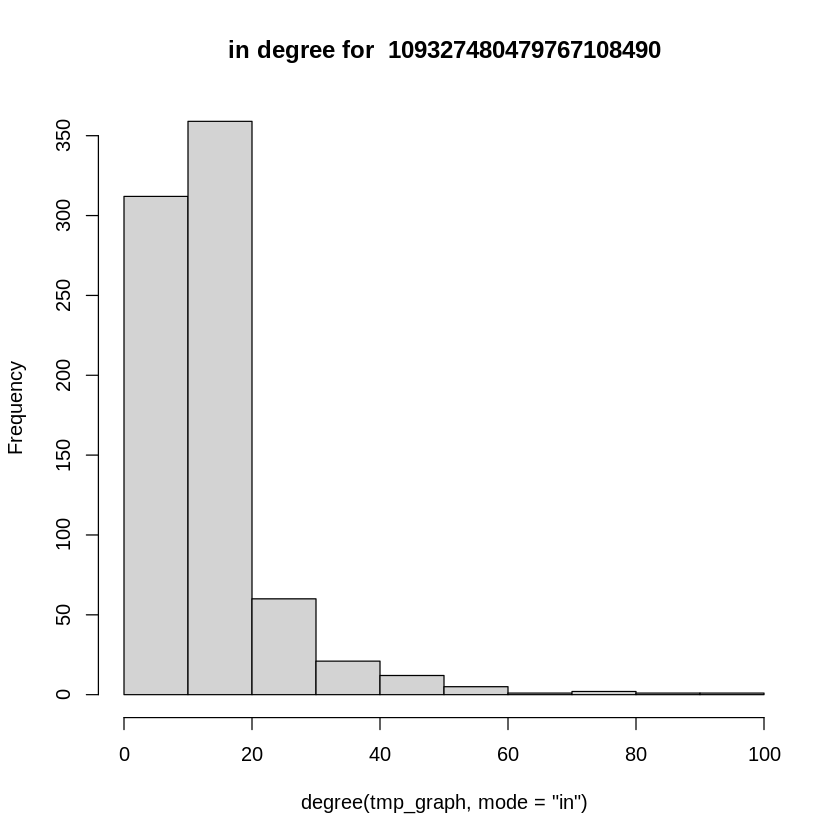

[1] "Index of node ID 115625564993990145546: 115"


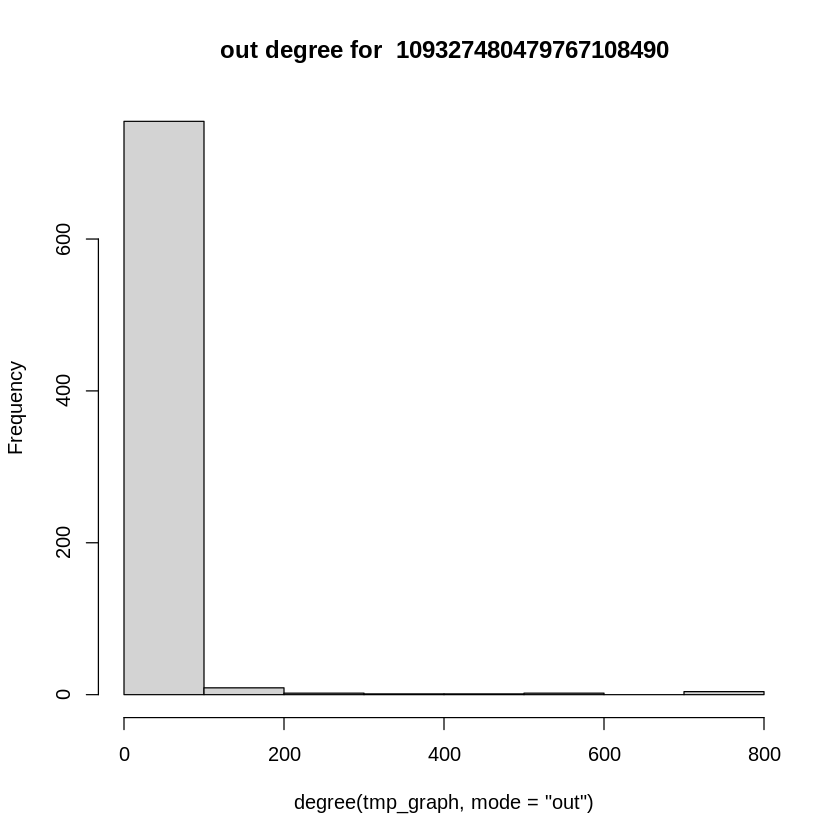

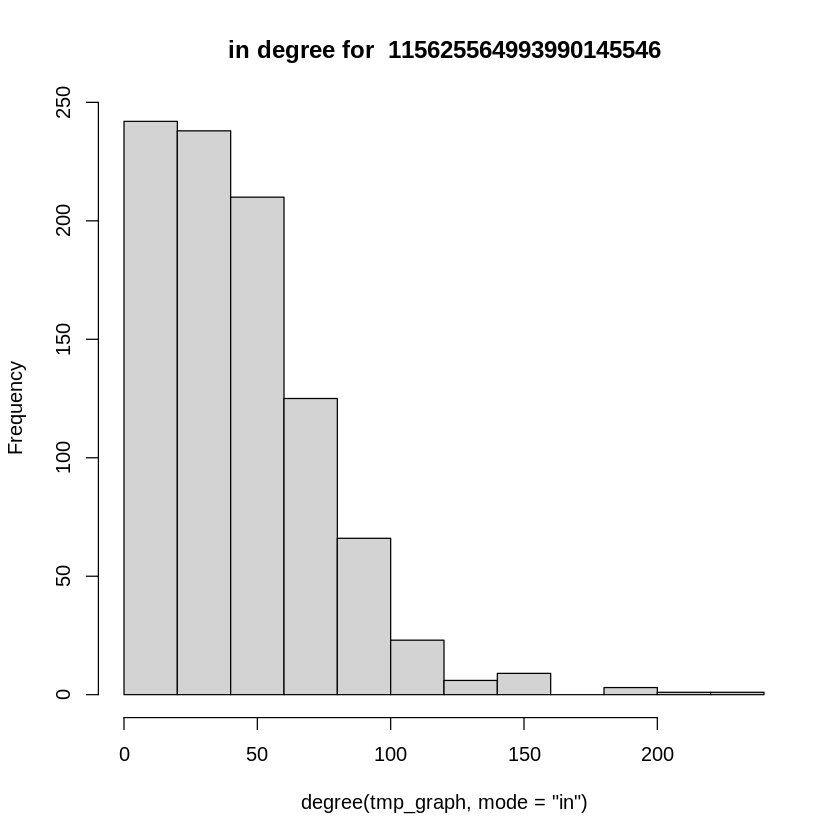

[1] "Index of node ID 101373961279443806744: 17"


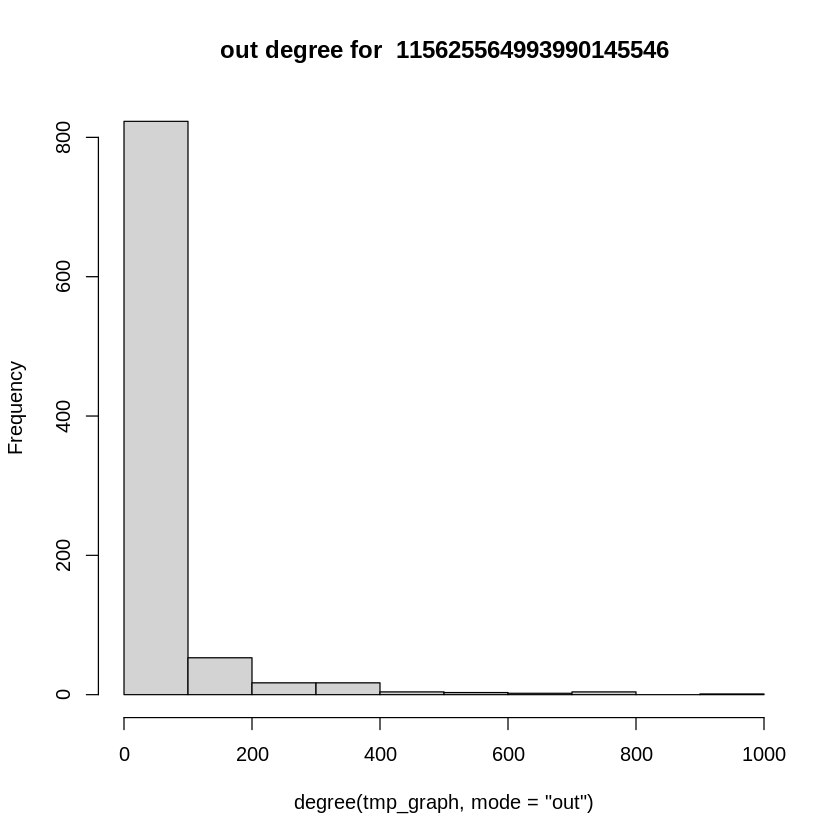

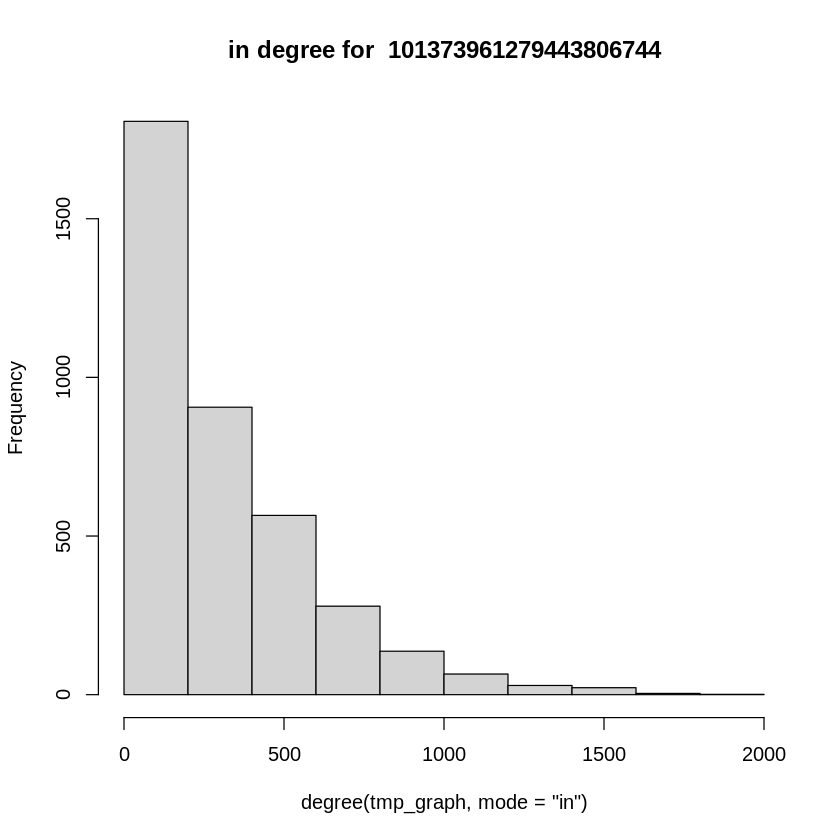

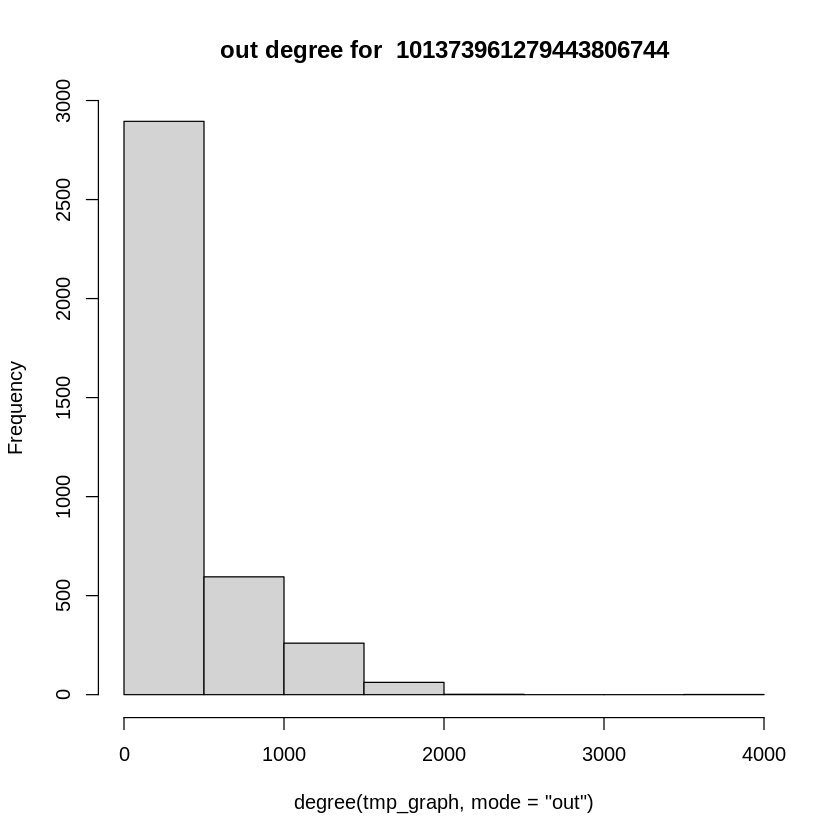

In [ ]:
interest_node = c('109327480479767108490', '115625564993990145546','101373961279443806744')
graph_inds = c()
for (i in 1: length(interest_node)){
    graph_ind <- which(node_names==interest_node[i])
    graph_inds <- c(graph_inds, graph_ind)
    print(sprintf("Index of node ID %s: %d", interest_node[i], graph_ind))
    tmp_graph = final_graph[[graph_ind]]
    hist(degree(tmp_graph, mode="in"),main = paste("in degree for ", interest_node[i]))
    hist(degree(tmp_graph, mode="out"),main = paste("out degree for ", interest_node[i]))
}

<div class="alert alert-block alert-success">
<b>Answer 19:</b> The plots of the in-degree and out-degree distribution of these personal networks are shown above. Overall, the in-degree distribution of these three personal networks are quite similar and so is the out-degree distribution, However, if we compared the in-degree and out-degree distribution of each node ID, we can see that usually the out-degree distrubution is more skewed (almost 0 out-degree) than the in-degree distribution.
</div>

### 1. Community structure of personal networks

<div class="alert alert-block alert-success">
<b>Question 20:</b> For the 3 personal networks picked in Question 19, extract the community structure of each personal network using Walktrap community detection algorithm. Report the modularity scores and plot the communities using colors. Are the modularity scores similar? In this question, you should have 3 plots.
</div>

[1] "The modularity of node ID 109327480479767108490: 0.252765"
[1] "The modularity of node ID 115625564993990145546: 0.319473"


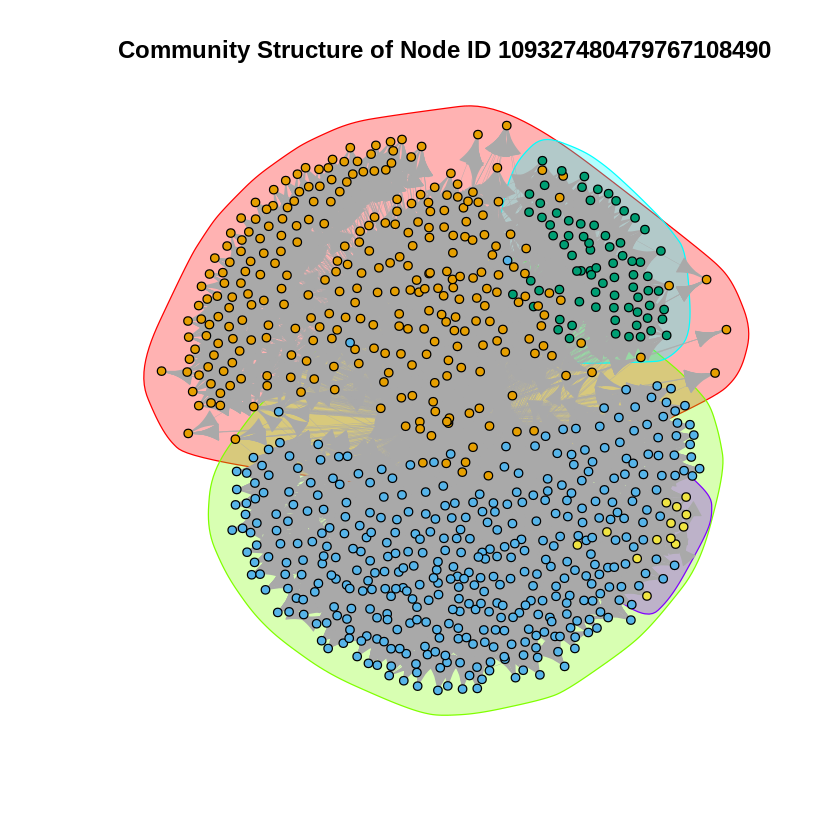

[1] "The modularity of node ID 101373961279443806744: 0.191090"


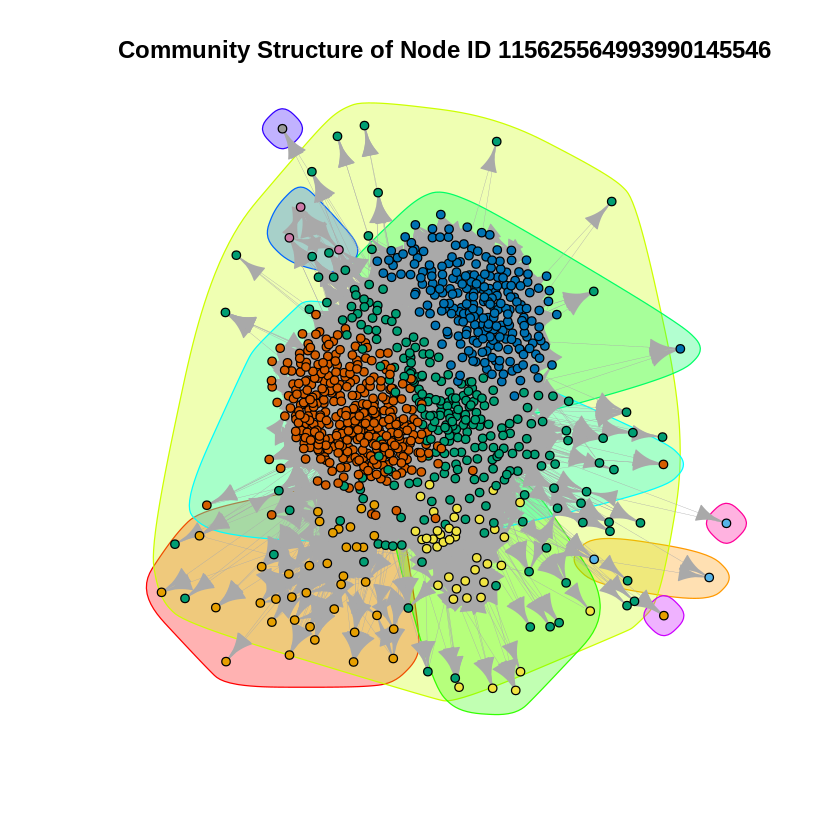

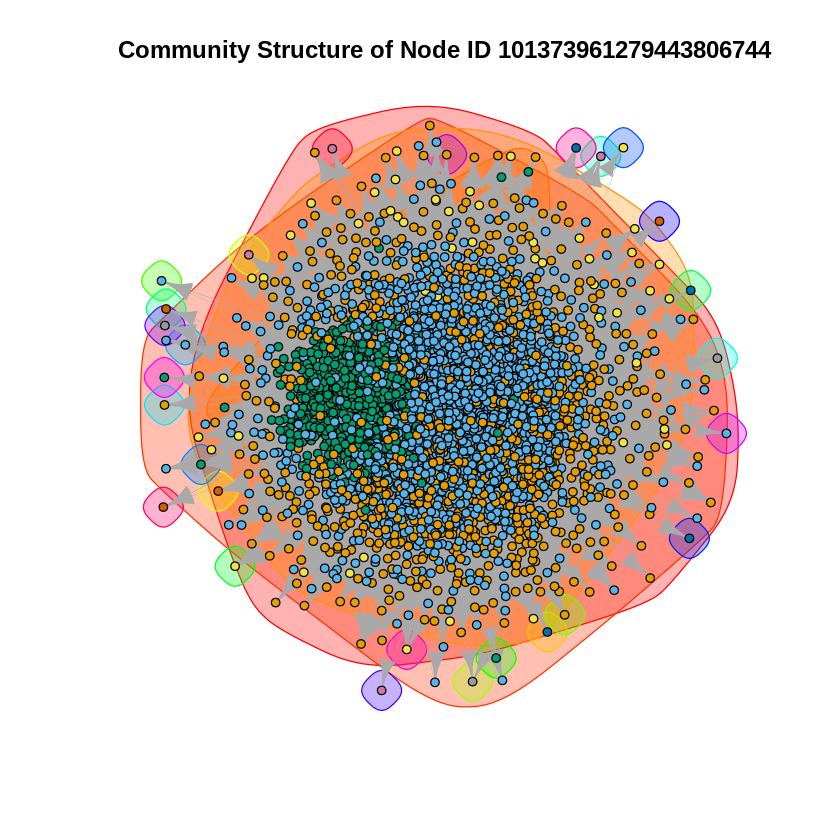

In [ ]:
interest_node = c('109327480479767108490', '115625564993990145546','101373961279443806744')
graph_inds = c()
for (i in 1: length(interest_node)){
    graph_ind <- which(node_names==interest_node[i])
    graph_inds <- c(graph_inds, graph_ind)
    # print(sprintf("Index of node ID %s: %d", interest_node[i], graph_ind))
    tmp_graph = final_graph[[graph_ind]]

    # find the community structure with Walktrap algorithm
    cur_wt <- cluster_walktrap(tmp_graph)
    cur_modul <- modularity(cur_wt)
    print(sprintf("The modularity of node ID %s: %f", interest_node[i], cur_modul))
    plot(tmp_graph, mark.groups=cur_wt, edge.width=0.3, 
         vertex.size=3, vertex.color=cur_wt$membership, vertex.label=NA, 
         main=sprintf("Community Structure of Node ID %s", interest_node[i]))
}

<div class="alert alert-block alert-success">
<b>Answer 20:</b> The modularity scores for the three nodes are shown above. According to the results, the modularity scores are not similar but also not far away from each other, with around a difference of 0.06.
</div>

<div class="alert alert-block alert-success">
<b>Question 21:</b> Based on the expression for $h$ and $c$, explain the meaning of homogeneity and completeness in words.
</div>

<div class="alert alert-block alert-success">
<b>Answer 21:</b> The honogeneity represents the purity of the community $K_{j}$. If all nodes in the community $K_{j}$ belongs to the same circle $C_{i}$, then the homogeneity is the highest, i.e. equal to 1. The completeness, on the other hand, represents the purity of the circle $C_{i}$. If all nodes in the circle $C_{i}$ have been assigned to the same community $K_{j}$, then the completeness achieves the highest score, i.e. 1.
</div>

<div class="alert alert-block alert-success">
<b>Question 22:</b> Compute the $h$ and $c$ values for the community structures of the 3 personal network (same nodes as Question 19). Interpret the values and provide a detailed explanation. Are there negative values? Why?
</div>

In [ ]:
# iterate through 3 selected node ID
interest_node <- c('109327480479767108490', '115625564993990145546', '101373961279443806744')
for (node in 1:length(interest_node)) {
  # init 
  Hc <- 0
  Hk <- 0
  Hck <- 0
  Hkc <- 0

  # get the personalized network
  tmp_graph <- read_graph(paste("gplus/", interest_node[node], ".edges", sep=""),
                          format="ncol", directed=TRUE)
  tmp_graph <- add.vertices(tmp_graph, nv= 1, name=interest_node[node])
  graph_ind <- which(V(tmp_graph)$name==interest_node[node])
  el = c()
  for (v in 1:(vcount(tmp_graph) - 1)) {
      el = c(el, c(graph_ind, v))
  }
  tmp_graph = add_edges(tmp_graph, el)

  # get circles
  circles_files <- readLines(paste("gplus/", interest_node[node], ".circles", sep=""))
  circles = list()
  for (f in 1:length(circles_files)) {
      circle_nodes <- strsplit(circles_files[f], "\t")
      circles <- c(circles, list(circle_nodes[[1]][-1]))
  }

  # get total number of people with circle information: N
  all_circle <- c()
  for (i in circles){
      all_circle <- c(all_circle, i)
  }
  all_circle <- unique(all_circle)
  N <- length(all_circle)

  # find H(C)
  for (i in 1:length(circles)){
    ai <- length(circles[[i]])
    if (ai != 0) {
      Hc <- Hc + ((ai/N)*log10(ai/N))
    }
  }
  Hc <- Hc*-1

  # find the community structure with Walktrap algorithm
  cur_wt <- cluster_walktrap(tmp_graph)

  # find H(K), H(C|K) and H(K|C)
  for (j in 1:max(cur_wt$membership)) {
    Kj <- V(tmp_graph)$name[which(cur_wt$membership == j)]
    
    # H(K)
    bj <- length(intersect(Kj, all_circle))
    if (bj != 0) {
      Hk <- Hk + ((bj/N)*log10(bj/N))

      # H(C|K) and H(K|C)
      for (i in 1:length(circles)) {
        Ci <- circles[[i]]
        ai <- length(Ci)
        inter_nodes <- intersect(Kj, Ci)
        Aji = length(unique(inter_nodes))
        if (Aji != 0) {
          Hck <- Hck + ((Aji/N)*log10(Aji/bj))
          Hkc <- Hkc + ((Aji/N)*log10(Aji/ai))
        }
      }
    }
  }
  Hk <- Hk*-1
  Hck <- Hck*-1
  Hkc <- Hkc*-1

  # Calculate Homogenity and Completeness
  h <- 1- Hck/Hc
  c <- 1- Hkc/Hk

  # report
  print(sprintf("Node ID %s", interest_node[node]))
  print(sprintf("- Homogenity: %f", h))
  print(sprintf("- Completeness: %f", c))
}

[1] "Node ID 109327480479767108490"
[1] "- Homogenity: 0.851885"
[1] "- Completeness: 0.329874"
[1] "Node ID 115625564993990145546"
[1] "- Homogenity: 0.451890"
[1] "- Completeness: -3.423962"
[1] "Node ID 101373961279443806744"
[1] "- Homogenity: 0.003867"
[1] "- Completeness: -1.504238"


<div class="alert alert-block alert-success">
<b>Answer 22:</b> The homogenity and completeness scores for each ID node are reported above. Based on the results, we know that most of users of the personalized network of node ID 109327480479767108490 belongs to the same circle because of the high homogenity, but some of them are misclassified into different community, which leads to a low completeness score. For network of node ID 115625564993990145546 and node ID 101373961279443806744, the homogenity score is only around 0.45 and 0.0, respectively, meaning that half of the users or even most of the users from different circles in each network have been wrongly classified into a single community. Besides, they both have a negative completeness score. This can happen when $H(K|C)>H(K)$ due to a sparse $C$ and points towards a large mismatch between the number of circles and number of communities.
</div>